<a href="https://colab.research.google.com/github/Pratyushk2003/Hospital_front-end/blob/main/Copy_of_Untitled19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [132]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn import preprocessing
from sklearn.metrics import recall_score, accuracy_score, confusion_matrix, f1_score, matthews_corrcoef
from sklearn.metrics import precision_score, auc, roc_auc_score, roc_curve, precision_recall_curve, classification_report
import pickle
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
warnings.filterwarnings('ignore')

In [133]:
# loading the dataset to a Pandas DataFrame
df = pd.read_excel('/content/Copy_epileptic_seizures_Responses_New.xlsx')
df.head(5)

,CaseNo,PatientAge,Gender,EventDuration,Stereotypic,events_occur_time,wandering_headbanging_observation,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,...,fixed_Aura_Premonition,staring_blankly_chewing_smacking_lips,posturing_limbeyehead_deviation,violent_thrashing_movements,recovery,bittentongue,urine_without_knowledge,dislocated_shoulder,other_injuries,Final_Diagnosis
0,569502_C,18.0,Female,d. More than 10 minutes,"a. Yes, all are same",b. Only during wakefulness,b. No,a. Yes,a. Yes,b. No,...,a. Yes,b. No,a. Yes,b. No,a. Gradual/Slowly,a. No,b. No,b. No,b. No,b. Non epileptic spell
1,569498_C,26.0,Male,b. 1-5 minutes,"a. Yes, all are same",b. Only during wakefulness,b. No,a. Yes,b. No,b. No,...,b. No,b. No,b. No,b. No,a. Gradual/Slowly,a. No,b. No,b. No,b. No,a. Epileptic Seizure
2,546077_C,17.0,Male,c. 5-10 minutes,"a. Yes, all are same",c. Both during wakefulness and sleep,NaN,b. No,b. No,b. No,...,b. No,b. No,a. Yes,b. No,a. Gradual/Slowly,a. No,b. No,b. No,a. Yes,a. Epileptic Seizure
3,498260_C,40.0,Male,b. 1-5 minutes,"a. Yes, all are same",c. Both during wakefulness and sleep,NaN,b. No,b. No,b. No,...,a. Yes,a. Yes,a. Yes,b. No,b. Abrupt/Sudden (less than a minute),a. No,b. No,b. No,a. Yes,a. Epileptic Seizure
4,408708_C,17.0,Female,b. 1-5 minutes,"a. Yes, all are same",c. Both during wakefulness and sleep,NaN,a. Yes,b. No,b. No,...,a. Yes,a. Yes,b. No,b. No,a. Gradual/Slowly,a. No,b. No,b. No,b. No,a. Epileptic Seizure


In [134]:
df.drop(df.columns[0], axis=1, inplace=True)
df.drop(['wandering_headbanging_observation'], axis=1, inplace=True)


In [135]:
# Remove column

df.drop(['wandering_headbanging_observation','If seizure','If Non epileptic spell'], axis=1, inplace=True)
df.drop(df.columns[0], axis=1, inplace=True)

#print df
df

KeyError: ignored

In [136]:
df

,PatientAge,Gender,EventDuration,Stereotypic,events_occur_time,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,...,fixed_Aura_Premonition,staring_blankly_chewing_smacking_lips,posturing_limbeyehead_deviation,violent_thrashing_movements,recovery,bittentongue,urine_without_knowledge,dislocated_shoulder,other_injuries,Final_Diagnosis
0,18.0,Female,d. More than 10 minutes,"a. Yes, all are same",b. Only during wakefulness,a. Yes,a. Yes,b. No,a. Yes,b. No,...,a. Yes,b. No,a. Yes,b. No,a. Gradual/Slowly,a. No,b. No,b. No,b. No,b. Non epileptic spell
1,26.0,Male,b. 1-5 minutes,"a. Yes, all are same",b. Only during wakefulness,a. Yes,b. No,b. No,b. No,b. No,...,b. No,b. No,b. No,b. No,a. Gradual/Slowly,a. No,b. No,b. No,b. No,a. Epileptic Seizure
2,17.0,Male,c. 5-10 minutes,"a. Yes, all are same",c. Both during wakefulness and sleep,b. No,b. No,b. No,b. No,b. No,...,b. No,b. No,a. Yes,b. No,a. Gradual/Slowly,a. No,b. No,b. No,a. Yes,a. Epileptic Seizure
3,40.0,Male,b. 1-5 minutes,"a. Yes, all are same",c. Both during wakefulness and sleep,b. No,b. No,b. No,b. No,b. No,...,a. Yes,a. Yes,a. Yes,b. No,b. Abrupt/Sudden (less than a minute),a. No,b. No,b. No,a. Yes,a. Epileptic Seizure
4,17.0,Female,b. 1-5 minutes,"a. Yes, all are same",c. Both during wakefulness and sleep,a. Yes,b. No,b. No,b. No,b. No,...,a. Yes,a. Yes,b. No,b. No,a. Gradual/Slowly,a. No,b. No,b. No,b. No,a. Epileptic Seizure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497,44.0,Male,b. 1-5 minutes,b. Two different types (small ones and big ones),c. Both during wakefulness and sleep,b. No,b. No,b. No,b. No,b. No,...,a. Yes,a. Yes,a. Yes,b. No,a. Gradual/Slowly,"c. Yes, side of tongue",b. No,b. No,b. No,a. Epileptic Seizure
498,20.0,Male,b. 1-5 minutes,"a. Yes, all are same",b. Only during wakefulness,b. No,b. No,b. No,b. No,b. No,...,a. Yes,b. No,b. No,b. No,d. Responsive during spell,a. No,b. No,b. No,b. No,b. Non epileptic spell
499,12.0,Female,b. 1-5 minutes,d. It’s a first event,c. Both during wakefulness and sleep,a. Yes,b. No,b. No,b. No,a. Yes,...,b. No,a. Yes,b. No,b. No,c. Didn’t recover went back to sleep,"b. Yes, tip of tongue",b. No,b. No,b. No,a. Epileptic Seizure
500,12.0,Female,b. 1-5 minutes,d. It’s a first event,c. Both during wakefulness and sleep,a. Yes,b. No,b. No,b. No,a. Yes,...,b. No,a. Yes,b. No,b. No,c. Didn’t recover went back to sleep,"b. Yes, tip of tongue",b. No,b. No,b. No,a. Epileptic Seizure


In [137]:
import string

def cleanString():
  alphabet = list(string.ascii_lowercase)
  columns = list(df)
  for col in columns:
    for i, j in enumerate(df[col]):
      if type(j)==type('aaaa'):
        if len(j)<3:
          continue
        if j[0] in alphabet and j[1:3]==". ":
          df[col][i]=j[3:]

cleanString()
df.head()

,PatientAge,Gender,EventDuration,Stereotypic,events_occur_time,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,...,fixed_Aura_Premonition,staring_blankly_chewing_smacking_lips,posturing_limbeyehead_deviation,violent_thrashing_movements,recovery,bittentongue,urine_without_knowledge,dislocated_shoulder,other_injuries,Final_Diagnosis
0,18.0,Female,More than 10 minutes,"Yes, all are same",Only during wakefulness,Yes,Yes,No,Yes,No,...,Yes,No,Yes,No,Gradual/Slowly,No,No,No,No,Non epileptic spell
1,26.0,Male,1-5 minutes,"Yes, all are same",Only during wakefulness,Yes,No,No,No,No,...,No,No,No,No,Gradual/Slowly,No,No,No,No,Epileptic Seizure
2,17.0,Male,5-10 minutes,"Yes, all are same",Both during wakefulness and sleep,No,No,No,No,No,...,No,No,Yes,No,Gradual/Slowly,No,No,No,Yes,Epileptic Seizure
3,40.0,Male,1-5 minutes,"Yes, all are same",Both during wakefulness and sleep,No,No,No,No,No,...,Yes,Yes,Yes,No,Abrupt/Sudden (less than a minute),No,No,No,Yes,Epileptic Seizure
4,17.0,Female,1-5 minutes,"Yes, all are same",Both during wakefulness and sleep,Yes,No,No,No,No,...,Yes,Yes,No,No,Gradual/Slowly,No,No,No,No,Epileptic Seizure


In [138]:
for i,age in enumerate(df['PatientAge']):


    if type(age)==type('aa'):
        s=""
        s1=""
        #print(age)
        for alpha in age:
          if alpha >='0' and alpha<='9':
            s+=alpha
          elif alpha >='a' and alpha<='z':
            s1+=alpha

        s1=s1.lower()

        if s1=='month' or s1=='months':
          df['PatientAge'][i]=float(s)/12
        else:
           df['PatientAge'][i]=float(s)

In [139]:
df.shape
df.info()
df.describe(include='all')
df.corr()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 502 entries, 0 to 501
Data columns (total 25 columns):
 #   Column                                                             Non-Null Count  Dtype  
---  ------                                                             --------------  -----  
 0   PatientAge                                                         502 non-null    float64
 1   Gender                                                             502 non-null    object 
 2   EventDuration                                                      502 non-null    object 
 3   Stereotypic                                                        502 non-null    object 
 4   events_occur_time                                                  502 non-null    object 
 5   eyes_closed_during_event                                           502 non-null    object 
 6   weeping_before_during_after_episode                                502 non-null    object 
 7   patient_fall_suddenly_with

,PatientAge
PatientAge,1.0


In [140]:
df['PatientAge'] = df['PatientAge'].astype(float)

In [141]:
df.isna().sum() #checking for more  missing null values

PatientAge                                                           0
Gender                                                               0
EventDuration                                                        0
Stereotypic                                                          0
events_occur_time                                                    0
eyes_closed_during_event                                             0
weeping_before_during_after_episode                                  0
patient_fall_suddenly_without_limb_movements                         0
Was_patient_hyperventilating                                         0
loss_consciousness_after_urination_defecation                        0
side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing    0
observation_limbjerking                                              0
observe_postevent_stridulous_laboured_breathing                      0
upper_limb_jerks_observation                                         0
briefl

In [142]:
!pip install dython

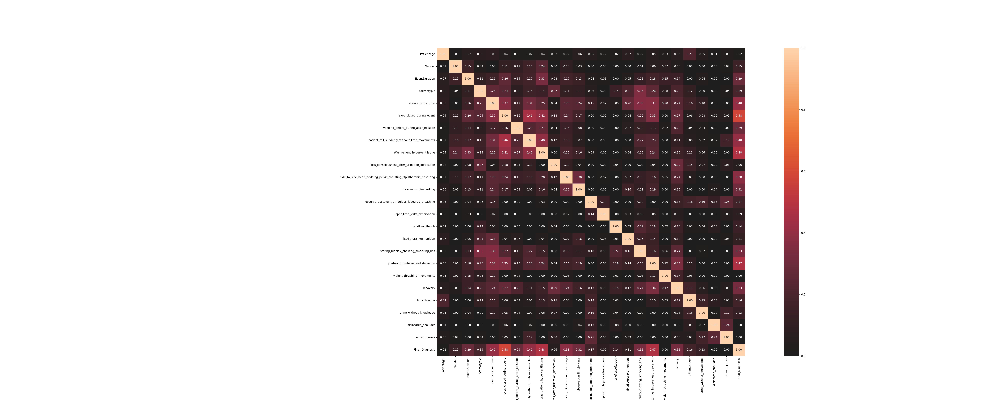

Final_Diagnosis                                                      1.000000
eyes_closed_during_event                                             0.582762
Was_patient_hyperventilating                                         0.483255
posturing_limbeyehead_deviation                                      0.469244
patient_fall_suddenly_without_limb_movements                         0.404903
events_occur_time                                                    0.403122
side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing    0.379443
recovery                                                             0.326325
staring_blankly_chewing_smacking_lips                                0.325994
observation_limbjerking                                              0.311504
EventDuration                                                        0.291232
weeping_before_during_after_episode                                  0.290035
Stereotypic                                                     

In [143]:
from dython.nominal import associations

complete_correlation= associations(df, filename= 'complete_correlation.png', figsize=(50,20))
complete_correlation['corr']['Final_Diagnosis'].abs().sort_values(ascending=False)

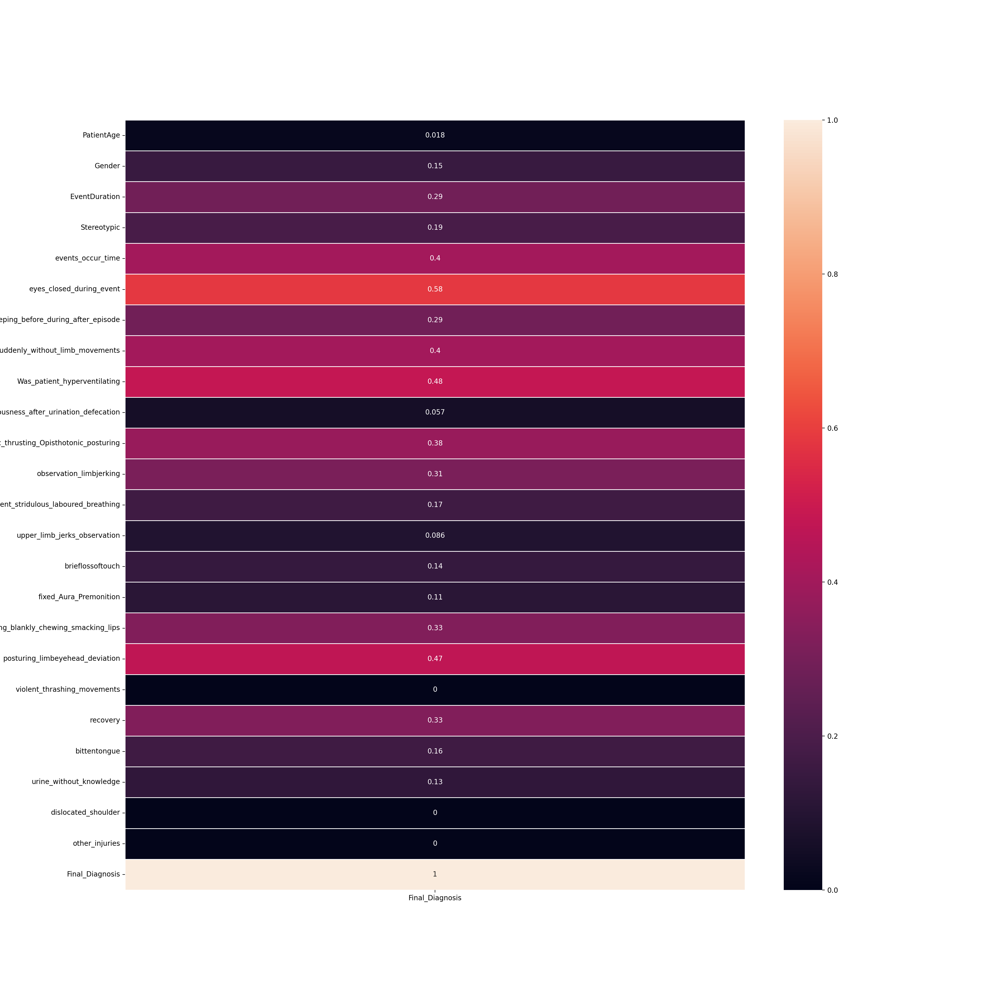

In [144]:
from pprint import pprint
# pprint(c_mat)
# c_mat['corr']

fig, ax = plt.subplots(figsize = (20,20))

columns = list(df)
result_cols = ['Final_Diagnosis']

for col in result_cols:
  columns.remove(col)

sns.heatmap(complete_correlation['corr'][result_cols], annot = True, linewidths = .5, ax = ax)
plt.show()

<Axes: title={'center': 'Final diagnosis'}>

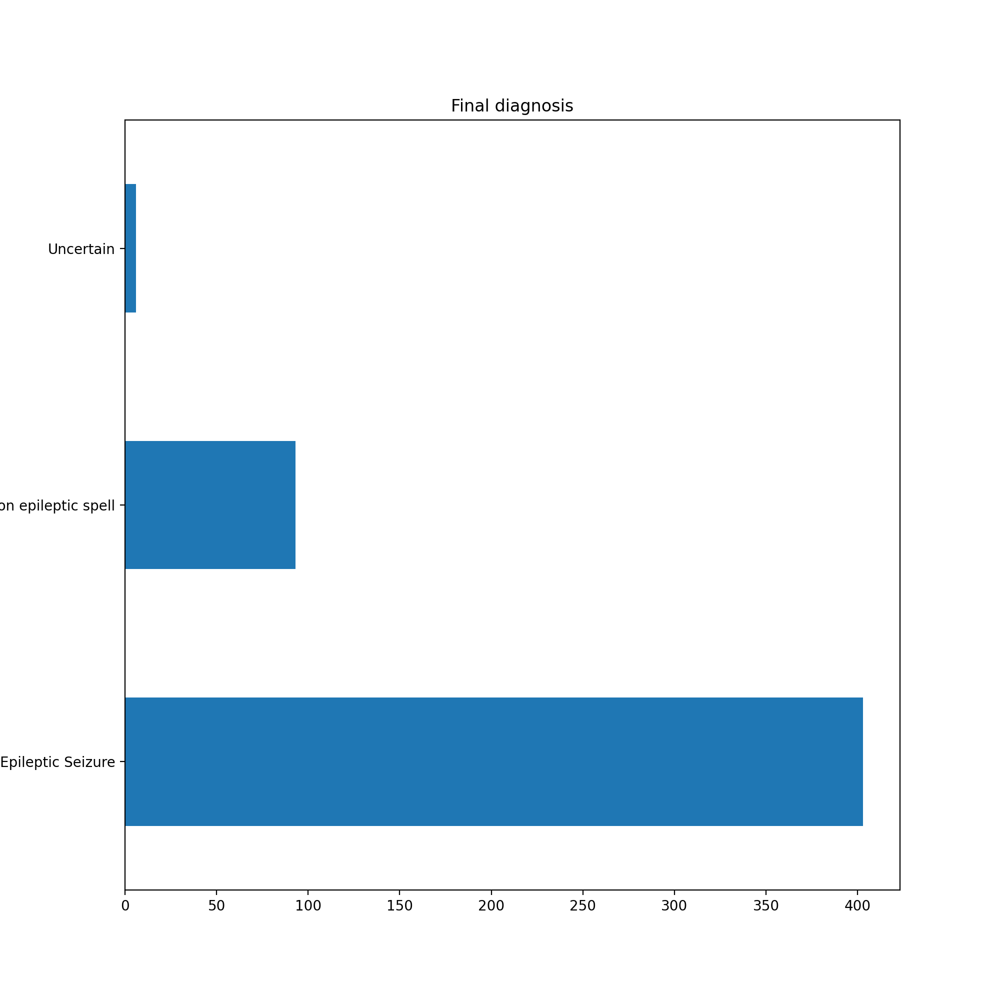

In [145]:
#checking for how many patients were epileptic/ uncertain/not epileptic
df['Final_Diagnosis'].value_counts().plot(kind='barh',title="Final diagnosis")

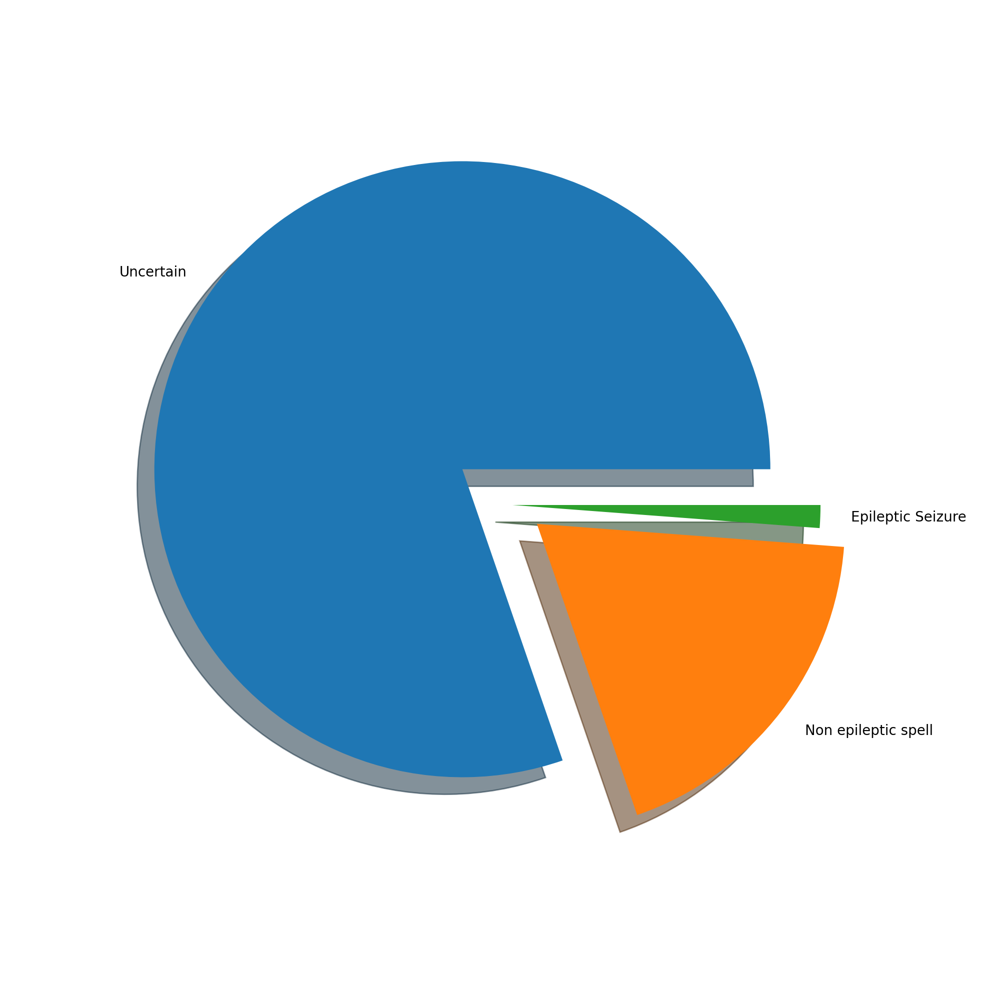

In [146]:
ss = df['Final_Diagnosis'].value_counts()
mylabels = ["Uncertain", "Non epileptic spell","Epileptic Seizure"]
myexplode = [0.2, 0.1, 0]
plt.pie(ss, labels = mylabels, explode = myexplode, shadow = True)

plt.show()

In [147]:
# observation list for the patients having answer yes or No
cols =list(df)

In [ ]:
# results = (df
#     .melt(value_vars=cols)
#     .groupby(['variable', 'value'])
#     .agg({'value': 'count'})
#     .unstack()
#     .reset_index()
#     .droplevel(level=0, axis=1)
#     .assign(total = lambda x: x.sum(axis=1))
# )
# results

<Axes: title={'center': 'Recovery of the patients'}>

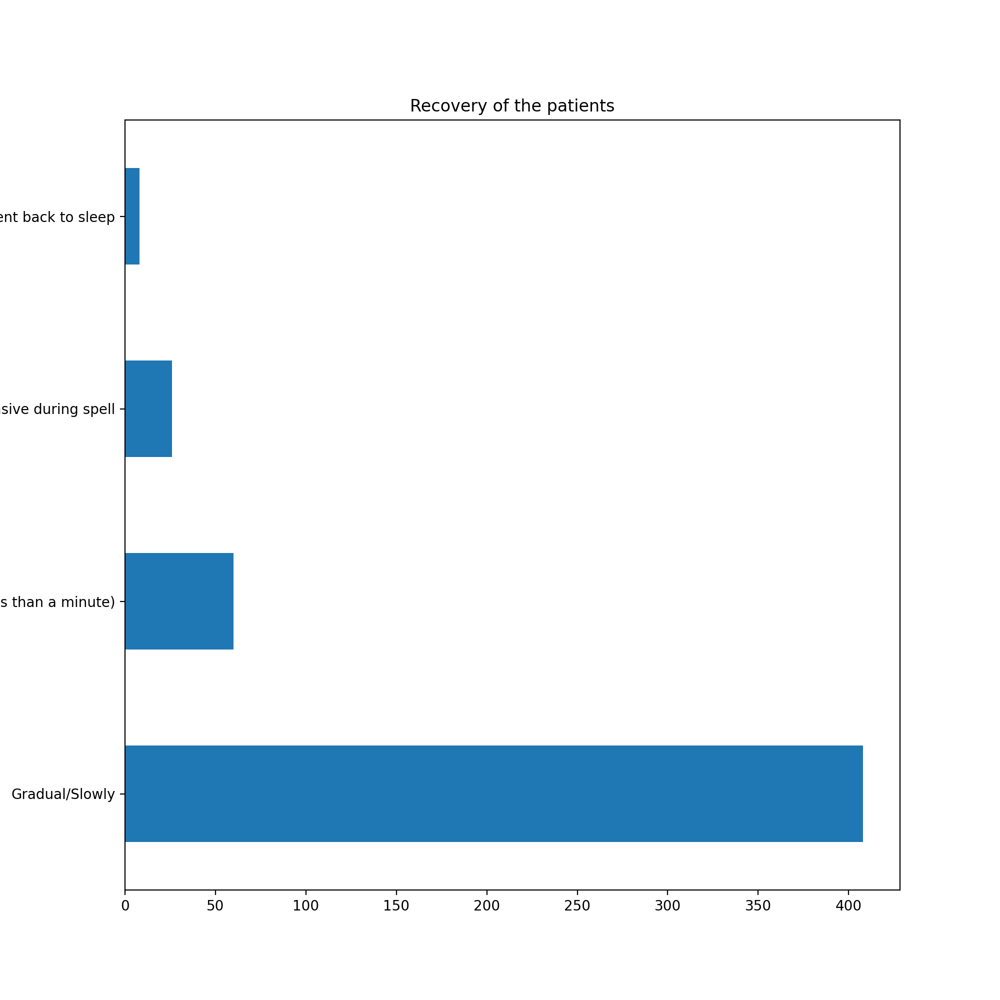

In [148]:
df['recovery'].value_counts().plot(kind='barh',title="Recovery of the patients")

<Axes: title={'center': 'bitter tongue status of the patients'}>

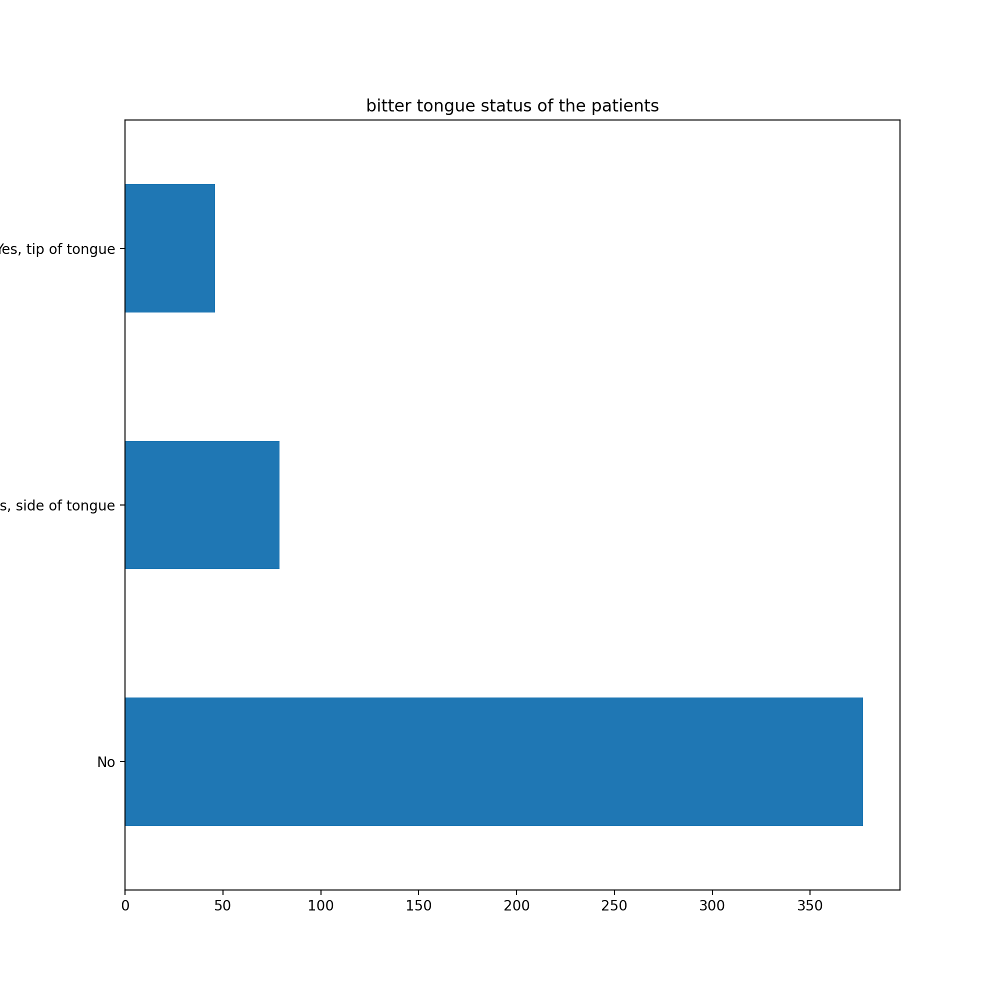

In [149]:
df['bittentongue'].value_counts().plot(kind='barh',title="bitter tongue status of the patients")

<Axes: title={'center': 'eyes closed during occurance of event'}>

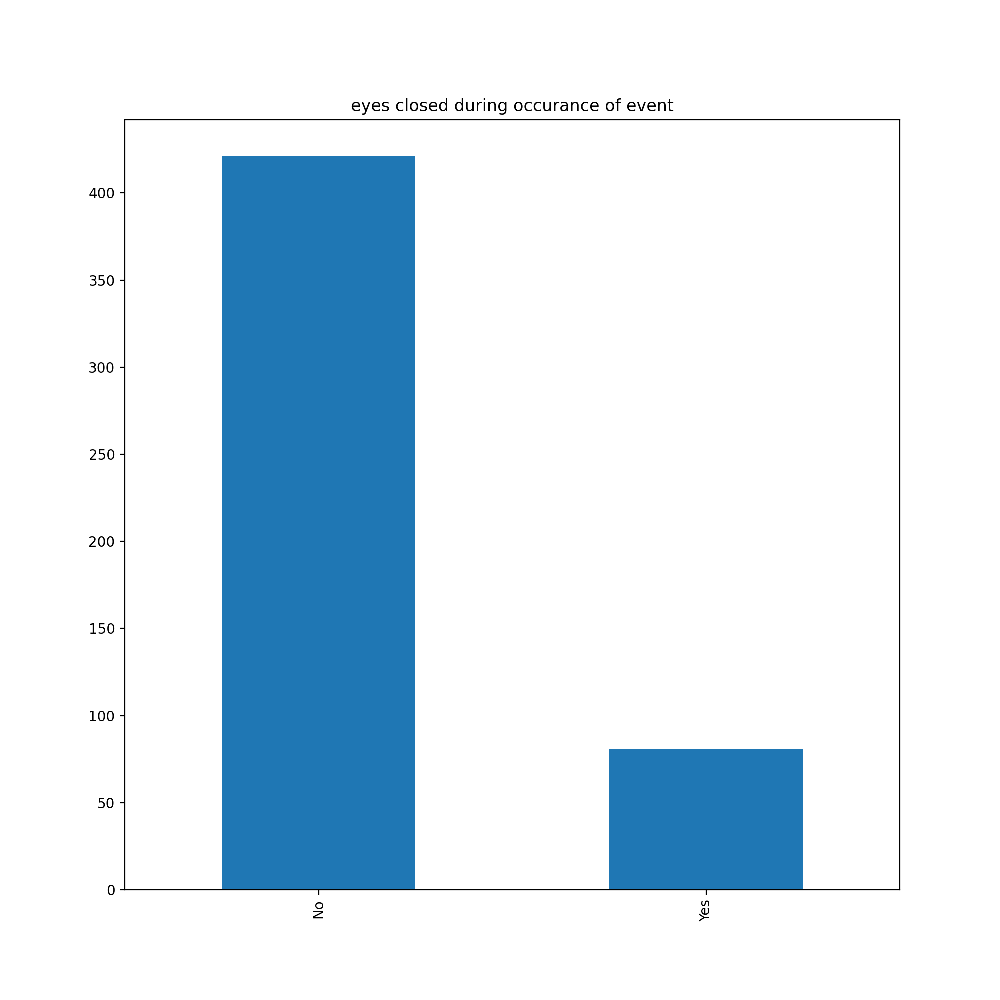

In [150]:
df['eyes_closed_during_event'].value_counts().plot(kind='bar',title="eyes closed during occurance of event")

In [151]:
#checking for some observation of value yes/no
#df['wandering_headbanging_observation'].value_counts().plot(kind='bar',title="wandering movements or headbanging observation",color = "#4CAF50")


<Axes: title={'center': 'weeping_before_during_after_episode'}>

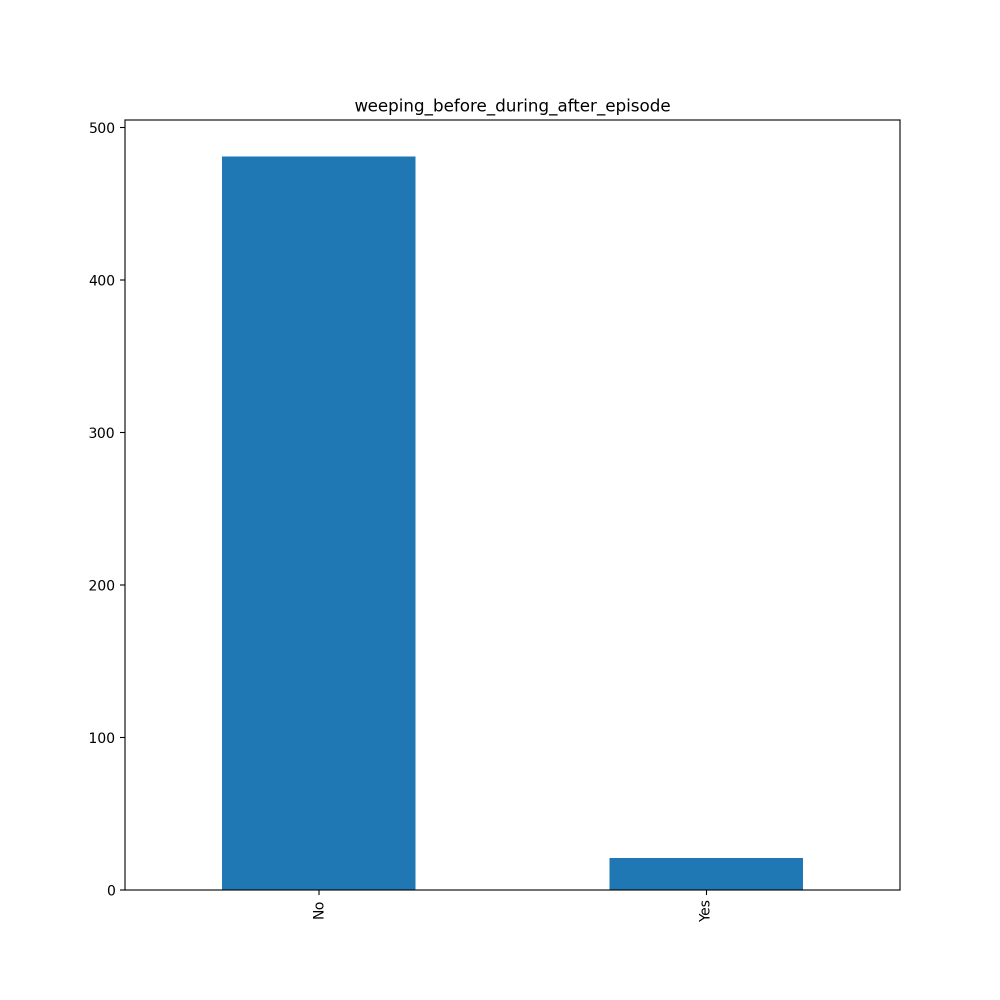

In [152]:
df['weeping_before_during_after_episode'].value_counts().plot(kind='bar',title="weeping_before_during_after_episode")

<Axes: title={'center': 'patient_fall_suddenly_without_limb_movements'}>

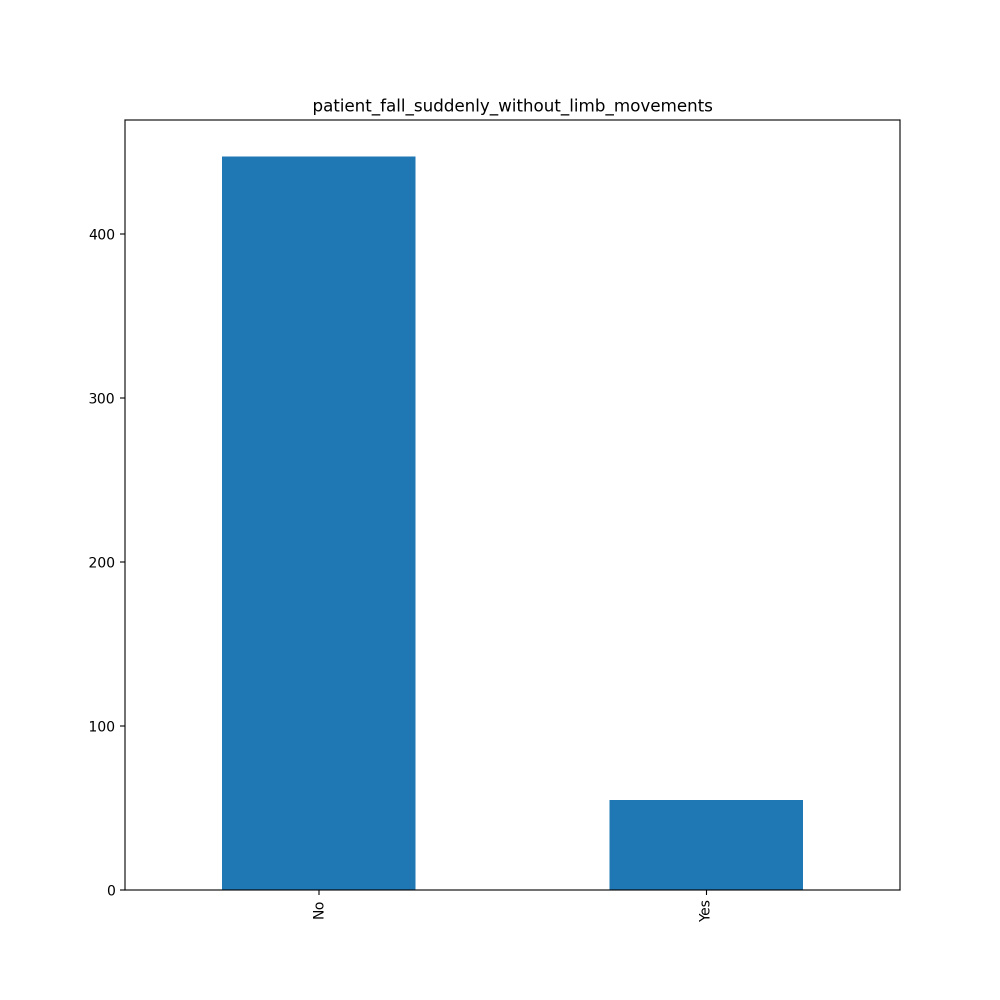

In [153]:
df['patient_fall_suddenly_without_limb_movements'].value_counts().plot(kind='bar',title="patient_fall_suddenly_without_limb_movements")

In [154]:
# # mapping to numerical value
# numeric_mappings = {}

# import string
# columns = list(df)
# columns=columns[1:]
# def replace():

#   for col in columns:
#     rowval=set()
#     for j in df[col]:
#       rowval.add(j)

#     enumval=[i for i in range(len(rowval))]
#     df[col].replace(list(rowval),enumval,inplace =True)
#     ind = 0
#     for rowvals in rowval:
#       numeric_mappings[rowvals] = enumval[ind]
#       ind+=1

# replace()
# df.head()

df.replace(np.nan, 0)
#making a deep copy of DF
#df_copy = df.copy(deep=True)
#df_copy

,PatientAge,Gender,EventDuration,Stereotypic,events_occur_time,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,...,fixed_Aura_Premonition,staring_blankly_chewing_smacking_lips,posturing_limbeyehead_deviation,violent_thrashing_movements,recovery,bittentongue,urine_without_knowledge,dislocated_shoulder,other_injuries,Final_Diagnosis
0,18.0,Female,More than 10 minutes,"Yes, all are same",Only during wakefulness,Yes,Yes,No,Yes,No,...,Yes,No,Yes,No,Gradual/Slowly,No,No,No,No,Non epileptic spell
1,26.0,Male,1-5 minutes,"Yes, all are same",Only during wakefulness,Yes,No,No,No,No,...,No,No,No,No,Gradual/Slowly,No,No,No,No,Epileptic Seizure
2,17.0,Male,5-10 minutes,"Yes, all are same",Both during wakefulness and sleep,No,No,No,No,No,...,No,No,Yes,No,Gradual/Slowly,No,No,No,Yes,Epileptic Seizure
3,40.0,Male,1-5 minutes,"Yes, all are same",Both during wakefulness and sleep,No,No,No,No,No,...,Yes,Yes,Yes,No,Abrupt/Sudden (less than a minute),No,No,No,Yes,Epileptic Seizure
4,17.0,Female,1-5 minutes,"Yes, all are same",Both during wakefulness and sleep,Yes,No,No,No,No,...,Yes,Yes,No,No,Gradual/Slowly,No,No,No,No,Epileptic Seizure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497,44.0,Male,1-5 minutes,Two different types (small ones and big ones),Both during wakefulness and sleep,No,No,No,No,No,...,Yes,Yes,Yes,No,Gradual/Slowly,"Yes, side of tongue",No,No,No,Epileptic Seizure
498,20.0,Male,1-5 minutes,"Yes, all are same",Only during wakefulness,No,No,No,No,No,...,Yes,No,No,No,Responsive during spell,No,No,No,No,Non epileptic spell
499,12.0,Female,1-5 minutes,It’s a first event,Both during wakefulness and sleep,Yes,No,No,No,Yes,...,No,Yes,No,No,Didn’t recover went back to sleep,"Yes, tip of tongue",No,No,No,Epileptic Seizure
500,12.0,Female,1-5 minutes,It’s a first event,Both during wakefulness and sleep,Yes,No,No,No,Yes,...,No,Yes,No,No,Didn’t recover went back to sleep,"Yes, tip of tongue",No,No,No,Epileptic Seizure


In [155]:
import pandas as pd
from dython.nominal import associations
from dython.nominal import identify_nominal_columns
categorical_features=identify_nominal_columns(df)
categorical_features

['Gender',
 'EventDuration',
 'Stereotypic',
 'events_occur_time',
 'eyes_closed_during_event',
 'weeping_before_during_after_episode',
 'patient_fall_suddenly_without_limb_movements',
 'Was_patient_hyperventilating',
 'loss_consciousness_after_urination_defecation',
 'side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing',
 'observation_limbjerking',
 'observe_postevent_stridulous_laboured_breathing',
 'upper_limb_jerks_observation',
 'brieflossoftouch',
 'fixed_Aura_Premonition',
 'staring_blankly_chewing_smacking_lips',
 'posturing_limbeyehead_deviation',
 'violent_thrashing_movements',
 'recovery',
 'bittentongue',
 'urine_without_knowledge',
 'dislocated_shoulder',
 'other_injuries',
 'Final_Diagnosis']

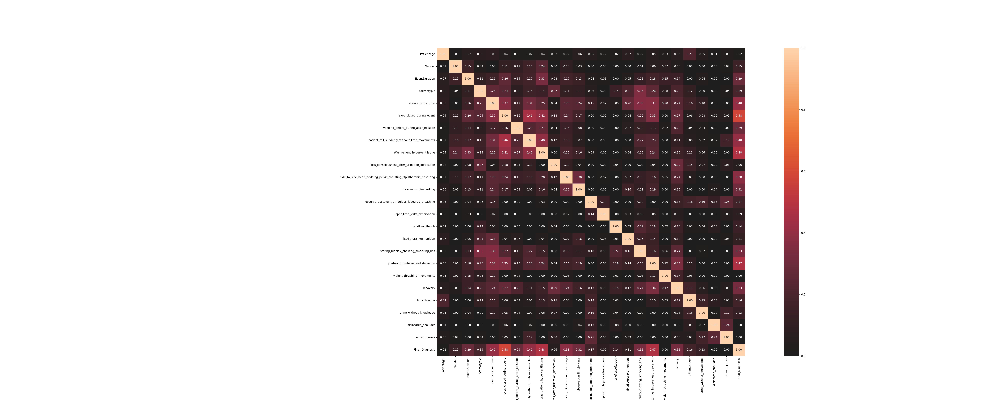

In [156]:
complete_correlation= associations(df, filename= 'complete_correlation.png', figsize=(50,20))

In [157]:
complete_correlation['corr']['Final_Diagnosis'].abs().sort_values(ascending=False)

Final_Diagnosis                                                      1.000000
eyes_closed_during_event                                             0.582762
Was_patient_hyperventilating                                         0.483255
posturing_limbeyehead_deviation                                      0.469244
patient_fall_suddenly_without_limb_movements                         0.404903
events_occur_time                                                    0.403122
side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing    0.379443
recovery                                                             0.326325
staring_blankly_chewing_smacking_lips                                0.325994
observation_limbjerking                                              0.311504
EventDuration                                                        0.291232
weeping_before_during_after_episode                                  0.290035
Stereotypic                                                     

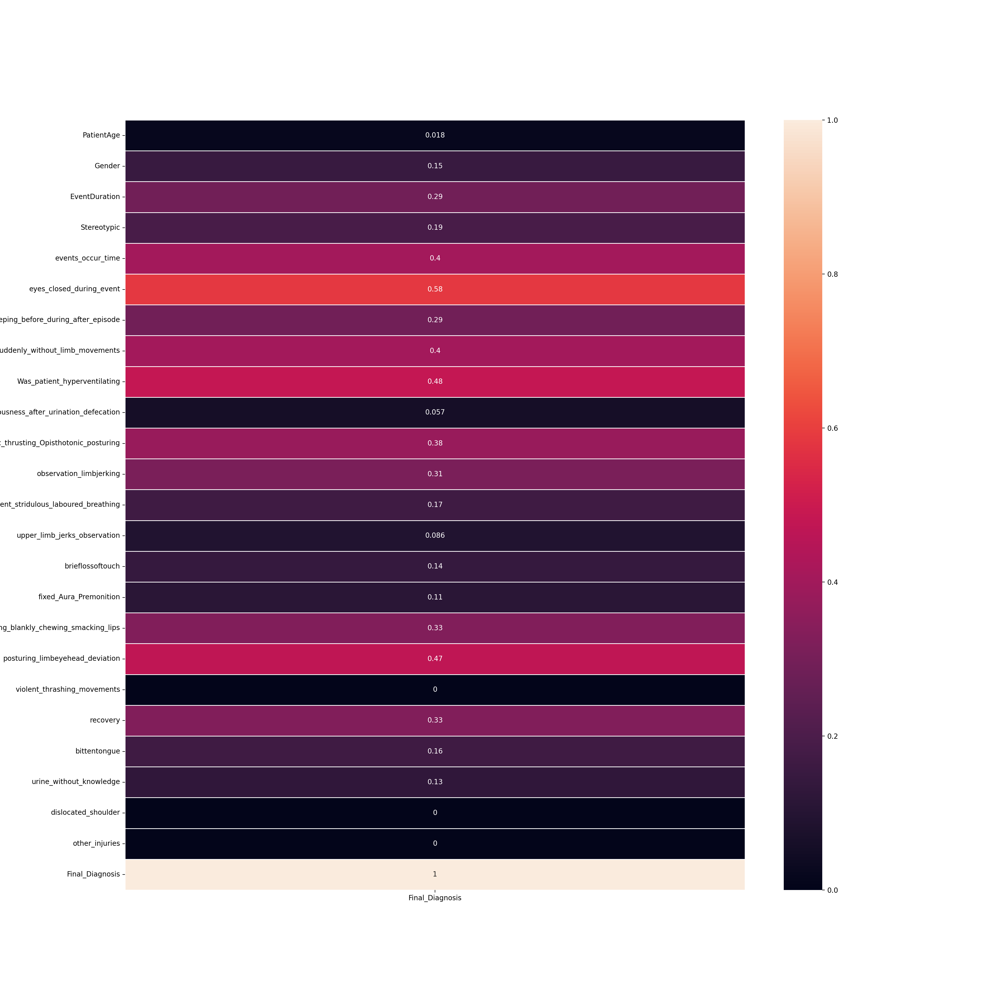

In [158]:
from pprint import pprint
# pprint(c_mat)
# c_mat['corr']

fig, ax = plt.subplots(figsize = (20,20))

columns = list(df)
result_cols = ['Final_Diagnosis']

for col in result_cols:
  columns.remove(col)

sns.heatmap(complete_correlation['corr'][result_cols], annot = True, linewidths = .5, ax = ax)
plt.show()

In [ ]:
#removing starting case col
#df_copy.drop(df_copy.columns[0], axis=1, inplace=True)
#removing last 2 col
##df_copy.drop(df_copy.columns[len(df_copy.columns)-1], axis=1, inplace=True)
#print df_copy
#df_copy

In [159]:
df['Final_Diagnosis'].value_counts()

Epileptic Seizure      403
Non epileptic spell     93
Uncertain                6
Name: Final_Diagnosis, dtype: int64

In [160]:
#index of values with 0 (uncertain value)
f = df.loc[df['Final_Diagnosis'] == 'Uncertain'].index
f

Int64Index([369, 394, 421, 445, 455, 488], dtype='int64')

In [161]:
#remove 0 values
df.drop(f, inplace = True)
df

,PatientAge,Gender,EventDuration,Stereotypic,events_occur_time,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,...,fixed_Aura_Premonition,staring_blankly_chewing_smacking_lips,posturing_limbeyehead_deviation,violent_thrashing_movements,recovery,bittentongue,urine_without_knowledge,dislocated_shoulder,other_injuries,Final_Diagnosis
0,18.0,Female,More than 10 minutes,"Yes, all are same",Only during wakefulness,Yes,Yes,No,Yes,No,...,Yes,No,Yes,No,Gradual/Slowly,No,No,No,No,Non epileptic spell
1,26.0,Male,1-5 minutes,"Yes, all are same",Only during wakefulness,Yes,No,No,No,No,...,No,No,No,No,Gradual/Slowly,No,No,No,No,Epileptic Seizure
2,17.0,Male,5-10 minutes,"Yes, all are same",Both during wakefulness and sleep,No,No,No,No,No,...,No,No,Yes,No,Gradual/Slowly,No,No,No,Yes,Epileptic Seizure
3,40.0,Male,1-5 minutes,"Yes, all are same",Both during wakefulness and sleep,No,No,No,No,No,...,Yes,Yes,Yes,No,Abrupt/Sudden (less than a minute),No,No,No,Yes,Epileptic Seizure
4,17.0,Female,1-5 minutes,"Yes, all are same",Both during wakefulness and sleep,Yes,No,No,No,No,...,Yes,Yes,No,No,Gradual/Slowly,No,No,No,No,Epileptic Seizure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497,44.0,Male,1-5 minutes,Two different types (small ones and big ones),Both during wakefulness and sleep,No,No,No,No,No,...,Yes,Yes,Yes,No,Gradual/Slowly,"Yes, side of tongue",No,No,No,Epileptic Seizure
498,20.0,Male,1-5 minutes,"Yes, all are same",Only during wakefulness,No,No,No,No,No,...,Yes,No,No,No,Responsive during spell,No,No,No,No,Non epileptic spell
499,12.0,Female,1-5 minutes,It’s a first event,Both during wakefulness and sleep,Yes,No,No,No,Yes,...,No,Yes,No,No,Didn’t recover went back to sleep,"Yes, tip of tongue",No,No,No,Epileptic Seizure
500,12.0,Female,1-5 minutes,It’s a first event,Both during wakefulness and sleep,Yes,No,No,No,Yes,...,No,Yes,No,No,Didn’t recover went back to sleep,"Yes, tip of tongue",No,No,No,Epileptic Seizure


In [ ]:
#storing df_copy to xl file in csv file
# from google.colab import files
# brandname = 'df_copy'
# df_copy.to_csv(brandname + '-subdirs_from_sitemap.csv', sep='\t')
# brandname = 'df_copy'
# files.download(brandname + '-subdirs_from_sitemap.csv')

In [ ]:
#storing it in the google sheet
#Export to Google Sheets(Doing the Auth)
# !pip install --upgrade --quiet gspread
# from google.colab import auth
# auth.authenticate_user()

# import gspread
# #from oauth2client.client import GoogleCredentials
# from google.auth import default
# creds, _ = default()

# gc = gspread.authorize(creds)

#Export to Google Sheets / Part 2 Export
#!pip uninstall gspread-dataframe
# !pip install --upgrade --quiet gspread_dataframe
#pip install gspread_dataframe
# from gspread_dataframe import get_as_dataframe, set_with_dataframe

# sh = gc.create(brandname + '-subdirs_from_sitemap')
# worksheet = gc.open(brandname + '-subdirs_from_sitemap').sheet1

# set_with_dataframe(worksheet, df_copy)
# print(
#     p9.ggplot(df, p9.aes(x='events_occur_time', y='PatientAge')) +
#     p9.geom_point(p9.aes(color='Final_Diagnosis')) +
#     p9.theme_bw())

In [162]:
# one hot encoding

new_cols = dict()
old_cols = []

for col in df:
  unique = set()
  for entry in df[col]:
    unique.add(entry)
  if len(unique) > 2 and type(list(unique)[0]) != type(1.0):
    old_cols.append(col)
    for category in unique:
      col_name = f"{col} {category}"
      new_cols[col_name] = []

      for entry in df[col]:
        if entry == category:
          new_cols[col_name].append('Yes')
        else:
          new_cols[col_name].append('No')

In [163]:
df.drop(old_cols, axis = 1,inplace=True)
for col_name in new_cols.keys():
  df[col_name] = new_cols[col_name]

In [164]:
df

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only during wakefulness,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,recovery Responsive during spell,recovery Gradual/Slowly,recovery Didn’t recover went back to sleep,recovery Abrupt/Sudden (less than a minute),bittentongue No,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue"
0,18.0,Female,Yes,Yes,No,Yes,No,No,No,Yes,...,Yes,No,No,No,Yes,No,No,Yes,No,No
1,26.0,Male,Yes,No,No,No,No,No,No,No,...,Yes,No,No,No,Yes,No,No,Yes,No,No
2,17.0,Male,No,No,No,No,No,No,No,Yes,...,No,No,Yes,No,Yes,No,No,Yes,No,No
3,40.0,Male,No,No,No,No,No,No,No,No,...,No,No,Yes,No,No,No,Yes,Yes,No,No
4,17.0,Female,Yes,No,No,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,Yes,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497,44.0,Male,No,No,No,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,No,No,Yes
498,20.0,Male,No,No,No,No,No,No,No,No,...,Yes,No,No,Yes,No,No,No,Yes,No,No
499,12.0,Female,Yes,No,No,No,Yes,No,No,No,...,No,No,Yes,No,No,Yes,No,No,Yes,No
500,12.0,Female,Yes,No,No,No,Yes,No,No,No,...,No,No,Yes,No,No,Yes,No,No,Yes,No


In [165]:
df.to_excel('/content/Epilepsy after one hot encoding.xlsx')

In [166]:
from sklearn.model_selection import train_test_split

y= df.Final_Diagnosis
x=df.drop('Final_Diagnosis',axis=1)

#X_train, X_test, y_train, y_test = train_test_split(df_copy[X_cols], df_copy[Y_col],test_size=0.2, random_state=42)
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)
y

0      Non epileptic spell
1        Epileptic Seizure
2        Epileptic Seizure
3        Epileptic Seizure
4        Epileptic Seizure
              ...         
497      Epileptic Seizure
498    Non epileptic spell
499      Epileptic Seizure
500      Epileptic Seizure
501      Epileptic Seizure
Name: Final_Diagnosis, Length: 496, dtype: object

In [167]:
x_train

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only during wakefulness,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,recovery Responsive during spell,recovery Gradual/Slowly,recovery Didn’t recover went back to sleep,recovery Abrupt/Sudden (less than a minute),bittentongue No,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue"
56,24.0,Male,No,No,No,No,No,No,No,Yes,...,No,No,Yes,No,Yes,No,No,No,No,Yes
227,21.0,Female,No,Yes,No,No,No,No,No,No,...,Yes,No,No,Yes,No,No,No,No,No,Yes
392,27.0,Female,No,No,No,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,Yes,No,No
329,5.0,Male,No,No,No,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,Yes,No,No
220,54.0,Male,No,No,No,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,No,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,8.0,Male,No,No,No,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,Yes,No,No
270,68.0,Male,No,No,No,No,Yes,No,Yes,No,...,No,Yes,No,No,No,No,Yes,Yes,No,No
348,12.0,Female,No,No,No,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,Yes,No,No
438,20.0,Female,No,No,No,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,No,No,Yes


In [168]:
x_test

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only during wakefulness,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,recovery Responsive during spell,recovery Gradual/Slowly,recovery Didn’t recover went back to sleep,recovery Abrupt/Sudden (less than a minute),bittentongue No,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue"
462,71.0,Female,No,No,No,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,Yes,No,No
73,77.0,Male,No,No,No,No,No,No,No,Yes,...,No,Yes,No,No,Yes,No,No,Yes,No,No
231,17.0,Male,No,No,No,No,No,No,No,No,...,Yes,No,No,No,Yes,No,No,Yes,No,No
175,13.0,Female,No,No,Yes,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,Yes,No,No
237,18.0,Male,No,No,No,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,Yes,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,26.0,Male,No,No,No,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,No,No,Yes
383,7.0,Male,No,No,No,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,Yes,No,No
19,32.0,Male,No,No,No,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,Yes,No,No
320,22.0,Female,No,No,No,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,Yes,No,No


In [169]:
y_train

56       Epileptic Seizure
227      Epileptic Seizure
392      Epileptic Seizure
329      Epileptic Seizure
220      Epileptic Seizure
              ...         
106      Epileptic Seizure
270      Epileptic Seizure
348      Epileptic Seizure
438      Epileptic Seizure
102    Non epileptic spell
Name: Final_Diagnosis, Length: 396, dtype: object

In [170]:
y_test

462    Epileptic Seizure
73     Epileptic Seizure
231    Epileptic Seizure
175    Epileptic Seizure
237    Epileptic Seizure
             ...        
247    Epileptic Seizure
383    Epileptic Seizure
19     Epileptic Seizure
320    Epileptic Seizure
489    Epileptic Seizure
Name: Final_Diagnosis, Length: 100, dtype: object

In [ ]:
#from google.colab import files
#uploaded = files.upload()

In [171]:
#from google.colab import drive
#drive.mount('/content/drive')
#path = "https://docs.google.com/spreadsheets/d/1w_Cv0-Hjal9KMStRTuLkPOc2JOfCAk-q6rKRisgArAY/edit?usp=sharing"
#df_bonus = pd.read_csv(path)
#df_bonus
df

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only during wakefulness,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,recovery Responsive during spell,recovery Gradual/Slowly,recovery Didn’t recover went back to sleep,recovery Abrupt/Sudden (less than a minute),bittentongue No,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue"
0,18.0,Female,Yes,Yes,No,Yes,No,No,No,Yes,...,Yes,No,No,No,Yes,No,No,Yes,No,No
1,26.0,Male,Yes,No,No,No,No,No,No,No,...,Yes,No,No,No,Yes,No,No,Yes,No,No
2,17.0,Male,No,No,No,No,No,No,No,Yes,...,No,No,Yes,No,Yes,No,No,Yes,No,No
3,40.0,Male,No,No,No,No,No,No,No,No,...,No,No,Yes,No,No,No,Yes,Yes,No,No
4,17.0,Female,Yes,No,No,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,Yes,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497,44.0,Male,No,No,No,No,No,No,No,No,...,No,No,Yes,No,Yes,No,No,No,No,Yes
498,20.0,Male,No,No,No,No,No,No,No,No,...,Yes,No,No,Yes,No,No,No,Yes,No,No
499,12.0,Female,Yes,No,No,No,Yes,No,No,No,...,No,No,Yes,No,No,Yes,No,No,Yes,No
500,12.0,Female,Yes,No,No,No,Yes,No,No,No,...,No,No,Yes,No,No,Yes,No,No,Yes,No


In [ ]:
# #%pip install statsmodels --upgrade
# !pip show matplotlib   #enables you to check version
# !pip install matplotlib==3.5

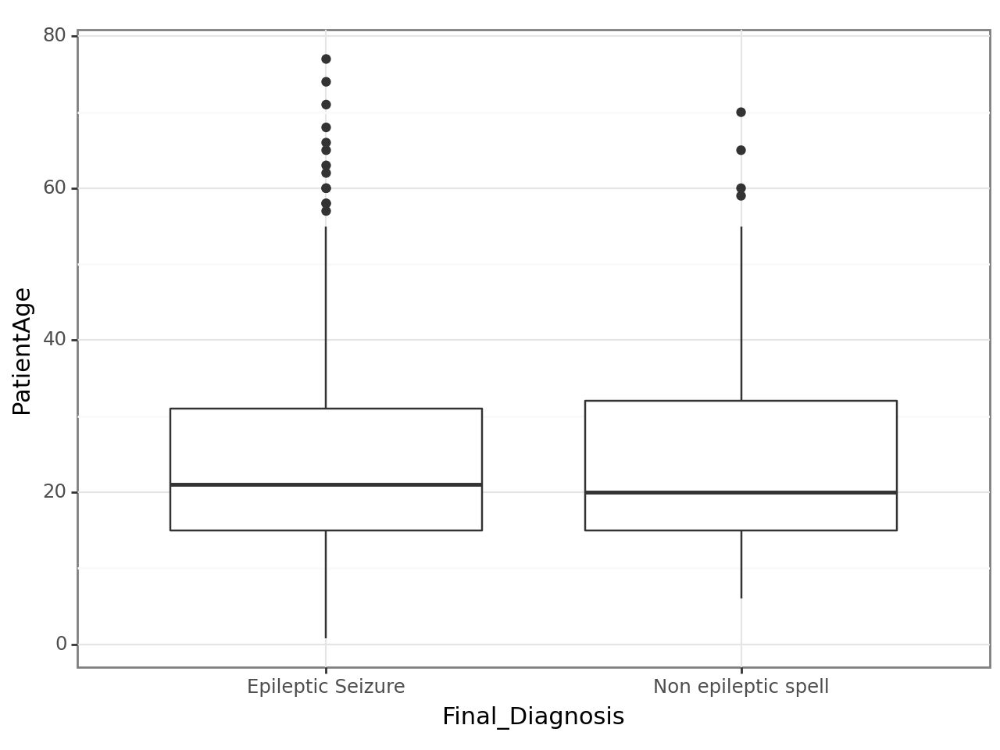

In [172]:
import plotnine as p9

print(
    p9.ggplot(df, p9.aes(x='Final_Diagnosis', y='PatientAge')) +
    p9.geom_boxplot() +
    p9.theme_bw())

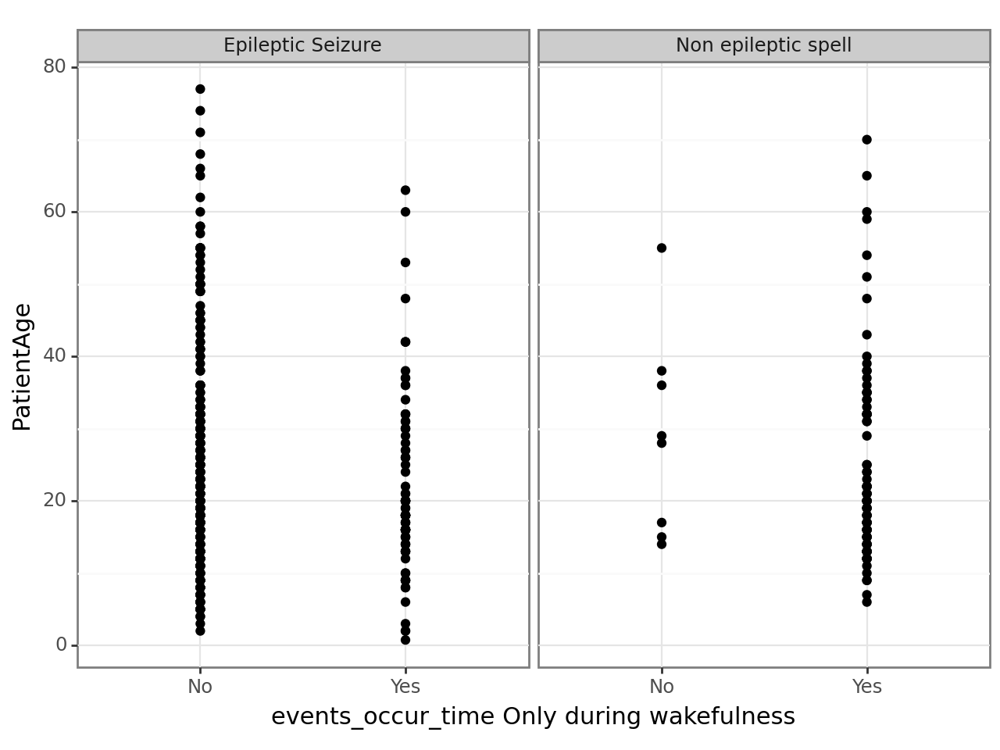

In [173]:
print(
    p9.ggplot(df, p9.aes(x='events_occur_time Only during wakefulness', y='PatientAge')) +
    p9.geom_point() +
    p9.facet_wrap('~ Final_Diagnosis') +
    p9.theme_bw())

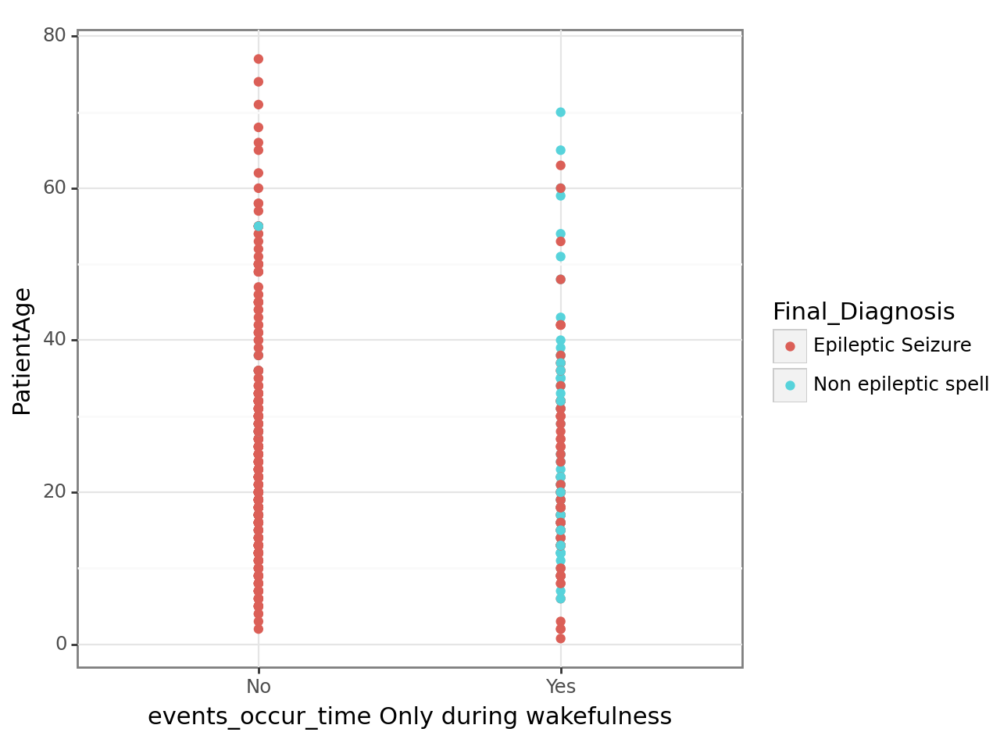

In [174]:
print(
    p9.ggplot(df, p9.aes(x='events_occur_time Only during wakefulness', y='PatientAge')) +
    p9.geom_point(p9.aes(color='Final_Diagnosis')) +
    p9.theme_bw())

In [175]:
print(x_train['PatientAge'].dtype)

cat_cols = []
for col in x_train.columns:
    if col!='PatientAge':
        cat_cols.append(True)
    else:
      cat_cols.append(False)


float64


In [176]:

# import SMOTE module from imblearn library
# pip install imblearn (if you don't have imblearn in your systhem)
!pip install --upgrade --quiet imblearn
from imblearn.over_sampling import SMOTENC

sm = SMOTENC( categorical_features = cat_cols, random_state = 10)
x_train_smote, y_train_smote = sm.fit_resample(x_train, y_train.ravel())


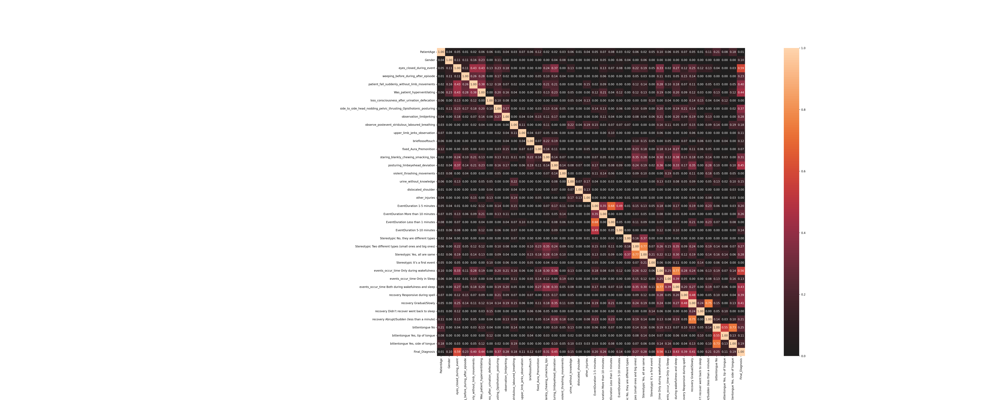

In [177]:
x_original = x_train.copy()
x_original['Final_Diagnosis'] = y_train.tolist()
correlations = {}
complete_correlation= associations(x_original, filename= 'complete_correlation.png', figsize=(50,20))

correlations['original'] = (complete_correlation['corr']["Final_Diagnosis"].abs().copy())

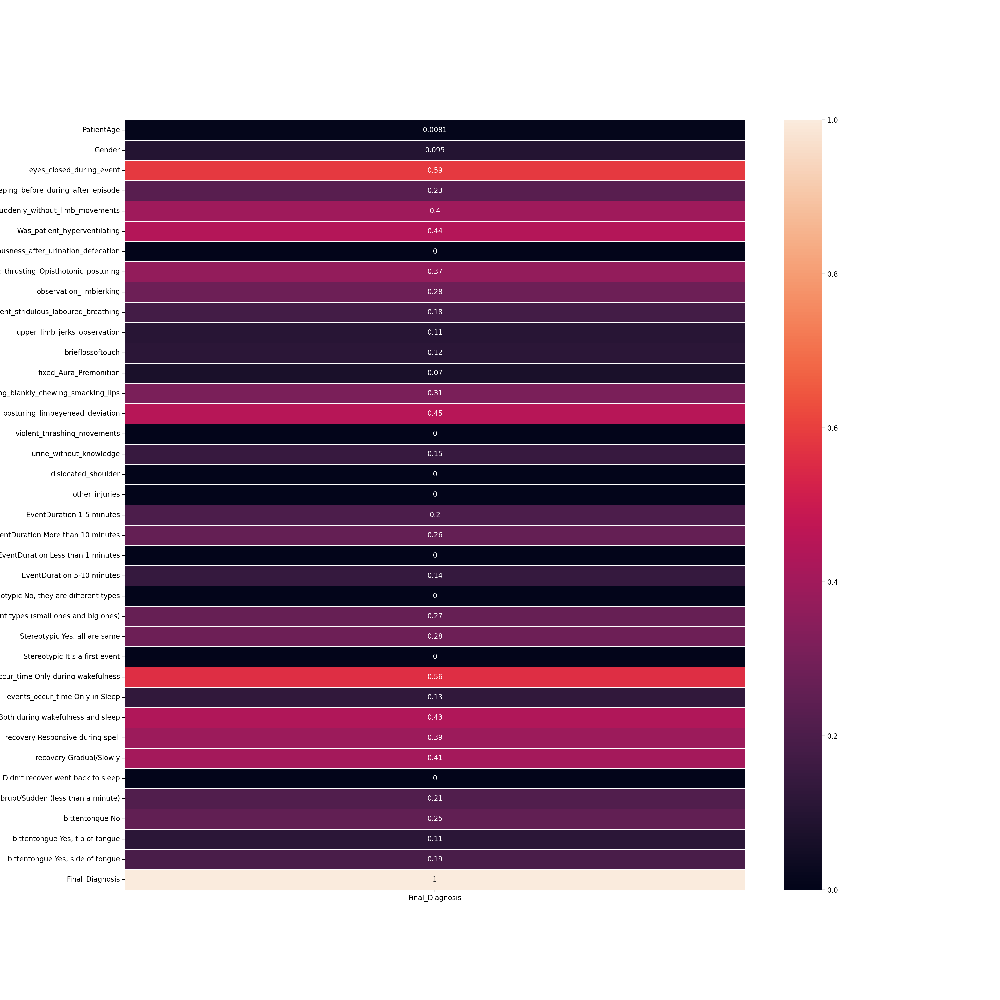

In [178]:
from pprint import pprint
# pprint(c_mat)
# c_mat['corr']

fig, ax = plt.subplots(figsize = (20,20))

columns = list(df)
result_cols = ['Final_Diagnosis']

for col in result_cols:
  columns.remove(col)

sns.heatmap(complete_correlation['corr'][result_cols], annot = True, linewidths = .5, ax = ax)
plt.show()

In [179]:
cor_mp = complete_correlation['corr']["Final_Diagnosis"].abs().sort_values(ascending=False)

Index(['Final_Diagnosis', 'eyes_closed_during_event',
       'events_occur_time Only during wakefulness',
       'posturing_limbeyehead_deviation', 'Was_patient_hyperventilating',
       'events_occur_time Both during wakefulness and sleep',
       'recovery Gradual/Slowly',
       'patient_fall_suddenly_without_limb_movements',
       'recovery Responsive during spell',
       'side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing',
       'staring_blankly_chewing_smacking_lips',
       'Stereotypic Yes, all are same', 'observation_limbjerking',
       'Stereotypic Two different types (small ones and big ones)',
       'EventDuration More than 10 minutes', 'bittentongue No',
       'weeping_before_during_after_episode',
       'recovery Abrupt/Sudden (less than a minute)',
       'EventDuration 1-5 minutes', 'bittentongue Yes, side of tongue',
       'observe_postevent_stridulous_laboured_breathing',
       'urine_without_knowledge', 'EventDuration 5-10 minutes',
       'e

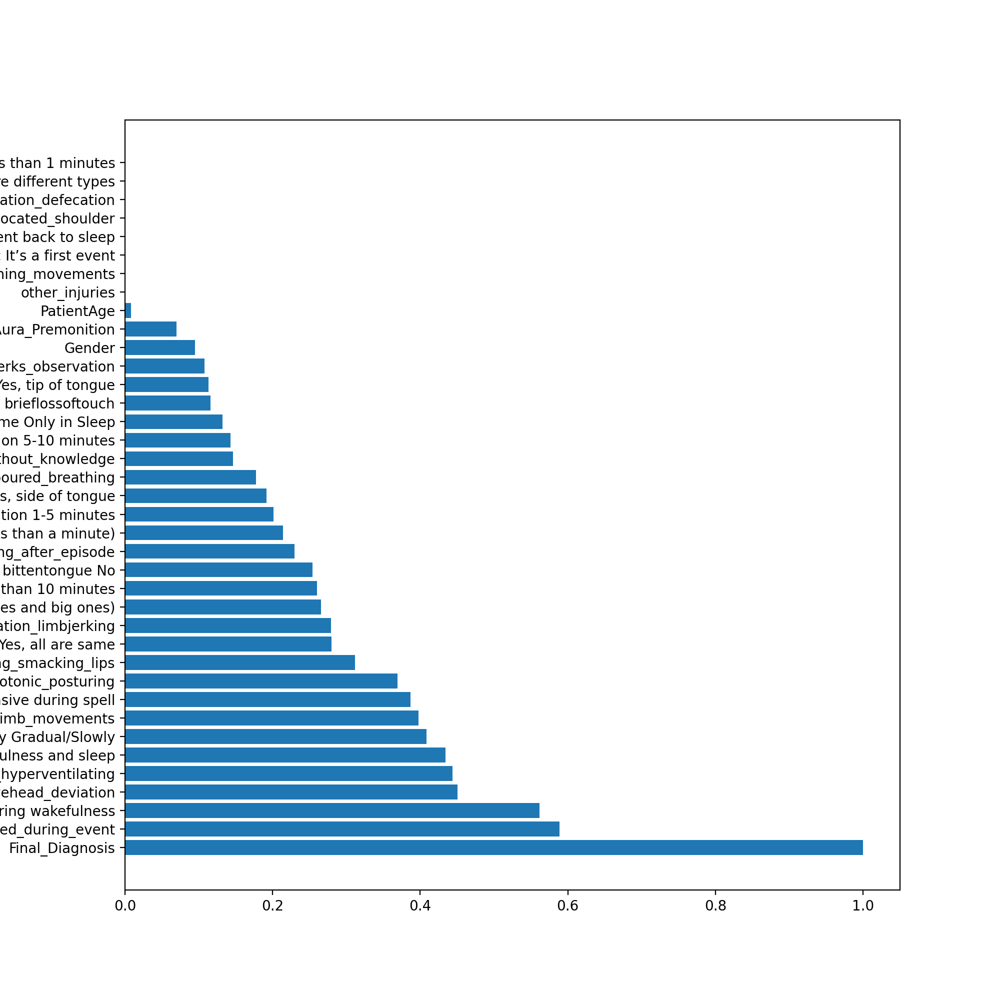

In [180]:
feature = cor_mp.keys()

print(feature)

plt.barh([feature[i] for i in range(len(feature))], cor_mp)
plt.rcParams['figure.figsize'] = [10, 11]
plt.show()

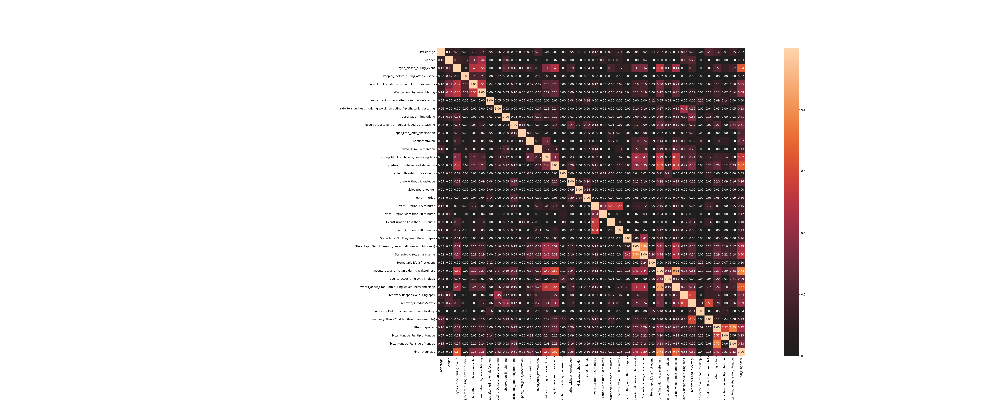

In [181]:
x_corr = x_train_smote.copy()
x_corr['Final_Diagnosis'] = y_train_smote.tolist()

complete_correlation= associations(x_corr, filename= 'complete_correlation.png', figsize=(50,20))
correlations['smote'] =(complete_correlation['corr']["Final_Diagnosis"].abs().copy())

In [182]:
cor_mp = complete_correlation['corr']["Final_Diagnosis"].abs().sort_values(ascending=False)

In [183]:
cor_mp

Final_Diagnosis                                                      1.000000
events_occur_time Only during wakefulness                            0.780582
posturing_limbeyehead_deviation                                      0.669646
events_occur_time Both during wakefulness and sleep                  0.666420
eyes_closed_during_event                                             0.638315
staring_blankly_chewing_smacking_lips                                0.518644
Stereotypic Yes, all are same                                        0.498987
Stereotypic Two different types (small ones and big ones)            0.428256
bittentongue No                                                      0.424907
recovery Gradual/Slowly                                              0.394504
Was_patient_hyperventilating                                         0.382601
patient_fall_suddenly_without_limb_movements                         0.350469
recovery Responsive during spell                                

Index(['Final_Diagnosis', 'events_occur_time Only during wakefulness',
       'posturing_limbeyehead_deviation',
       'events_occur_time Both during wakefulness and sleep',
       'eyes_closed_during_event', 'staring_blankly_chewing_smacking_lips',
       'Stereotypic Yes, all are same',
       'Stereotypic Two different types (small ones and big ones)',
       'bittentongue No', 'recovery Gradual/Slowly',
       'Was_patient_hyperventilating',
       'patient_fall_suddenly_without_limb_movements',
       'recovery Responsive during spell', 'bittentongue Yes, side of tongue',
       'observe_postevent_stridulous_laboured_breathing', 'brieflossoftouch',
       'urine_without_knowledge', 'events_occur_time Only in Sleep',
       'bittentongue Yes, tip of tongue',
       'side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing',
       'observation_limbjerking', 'upper_limb_jerks_observation',
       'Stereotypic No, they are different types', 'EventDuration 1-5 minutes',
    

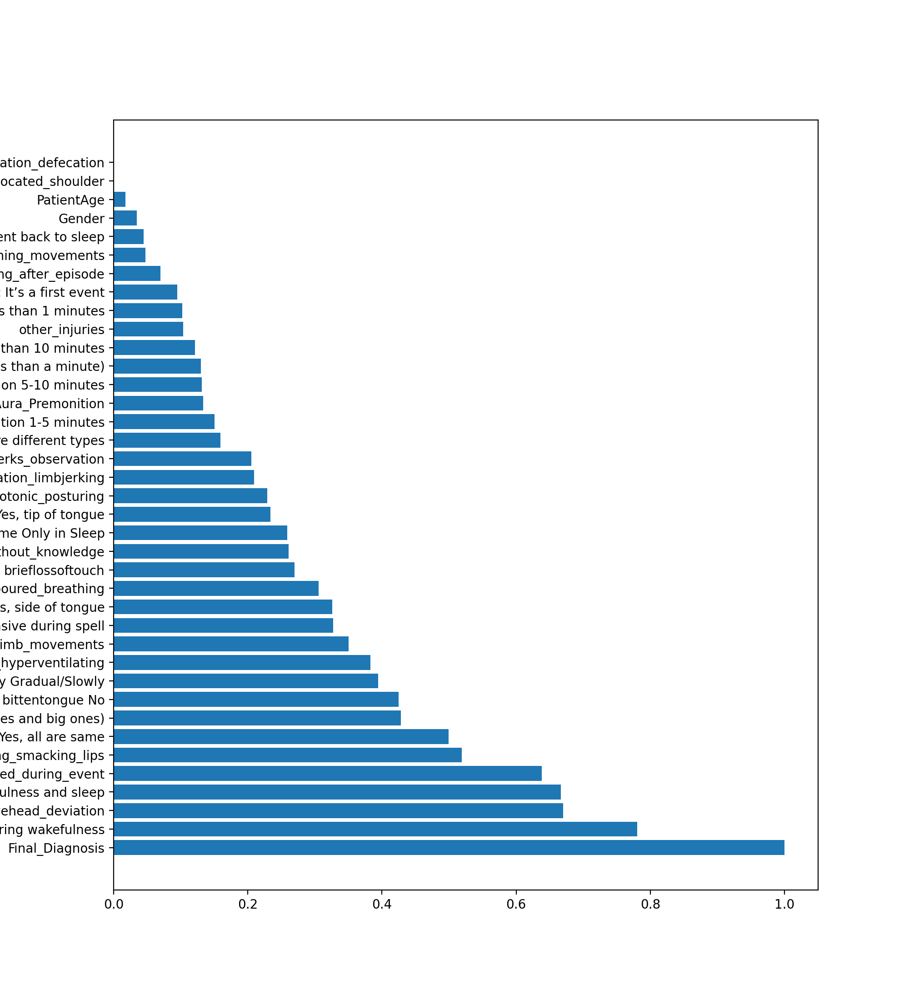

In [184]:
feature = cor_mp.keys()

print(feature)

plt.barh([feature[i] for i in range(len(feature))], cor_mp)
plt.rcParams['figure.figsize'] = [10, 11]
plt.show()

In [185]:
compare_original_smote = dict()

for k in correlations['original'].keys():
  compare_original_smote[k] = [correlations['original'][k]]

for k in correlations['smote'].keys():
  compare_original_smote[k].append(correlations['smote'][k])


In [ ]:
# ask if age is relevant

In [186]:
less_correlation = []

for k in correlations['smote'].keys():
  if correlations['smote'][k] < 0.05:
    less_correlation.append(k)

print(less_correlation)

['PatientAge', 'Gender', 'loss_consciousness_after_urination_defecation', 'violent_thrashing_movements', 'dislocated_shoulder', 'recovery Didn’t recover went back to sleep']


In [ ]:
# x_corr = x_train_smote.copy()
# x_corr['Final_Diagnosis'] = y_train_smote

# complete_correlation= associations(x_corr, filename= 'complete_correlation.png', figsize=(50,20))
# correlations['smote'] =(complete_correlation['corr']["Final_Diagnosis"].abs())

<Axes: title={'center': 'patient_fall_suddenly_without_limb_movements'}>

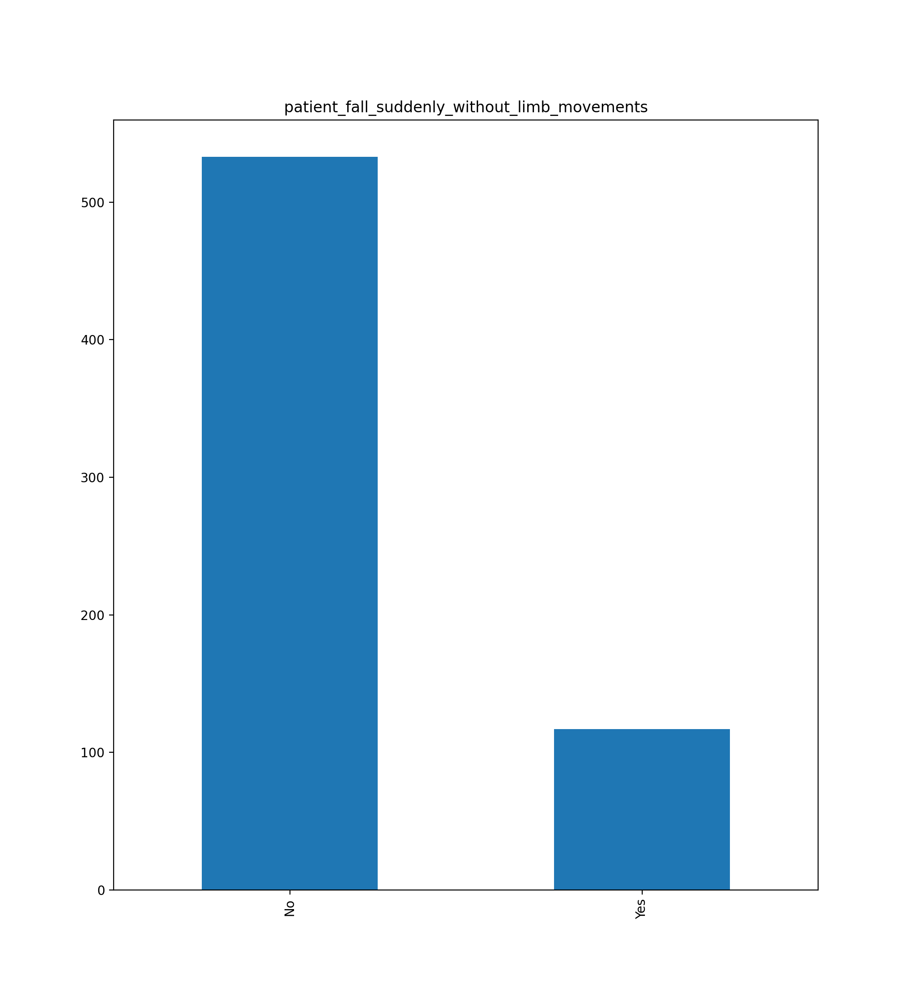

In [187]:
x_corr['patient_fall_suddenly_without_limb_movements'].value_counts().plot(kind='bar',title="patient_fall_suddenly_without_limb_movements")


<Axes: title={'center': 'weeping_before_during_after_episode'}>

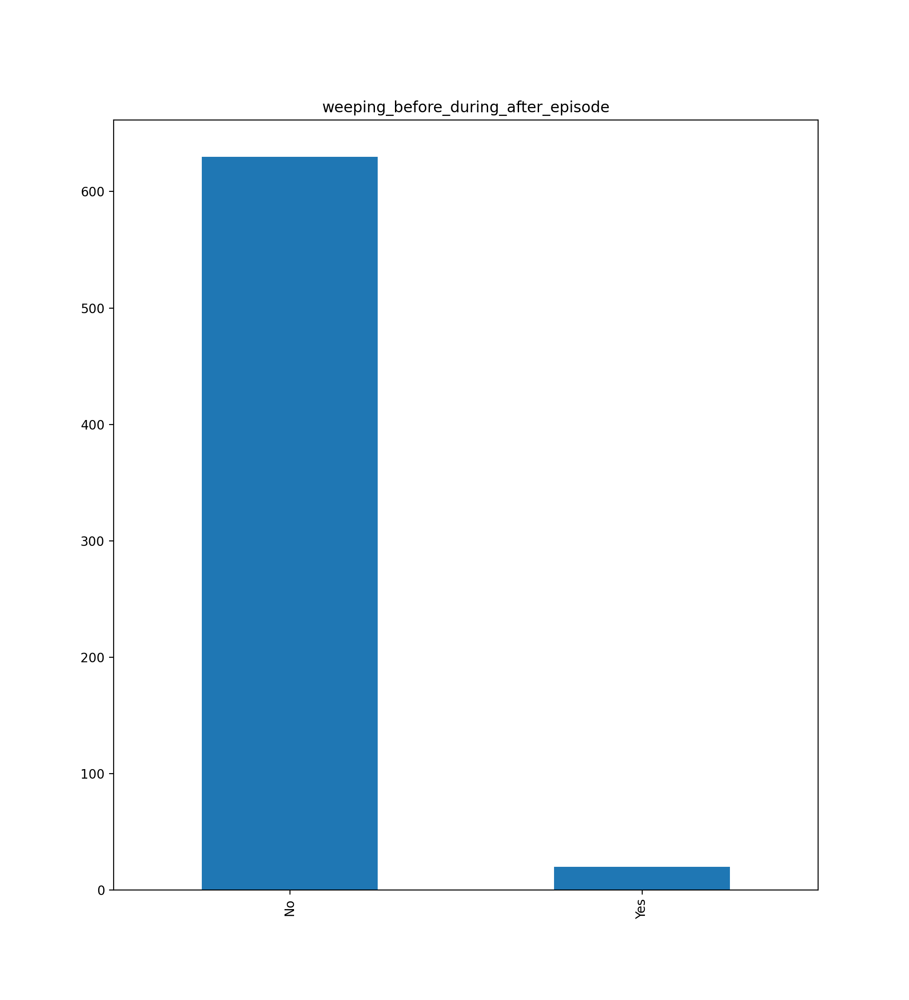

In [188]:
x_corr['weeping_before_during_after_episode'].value_counts().plot(kind='bar',title="weeping_before_during_after_episode")


In [ ]:
#x_corr['wandering_headbanging_observation'].value_counts().plot(kind='bar',title="wandering movements or headbanging observation",color = "#4CAF50")


<Axes: title={'center': 'eyes closed during occurance of event'}>

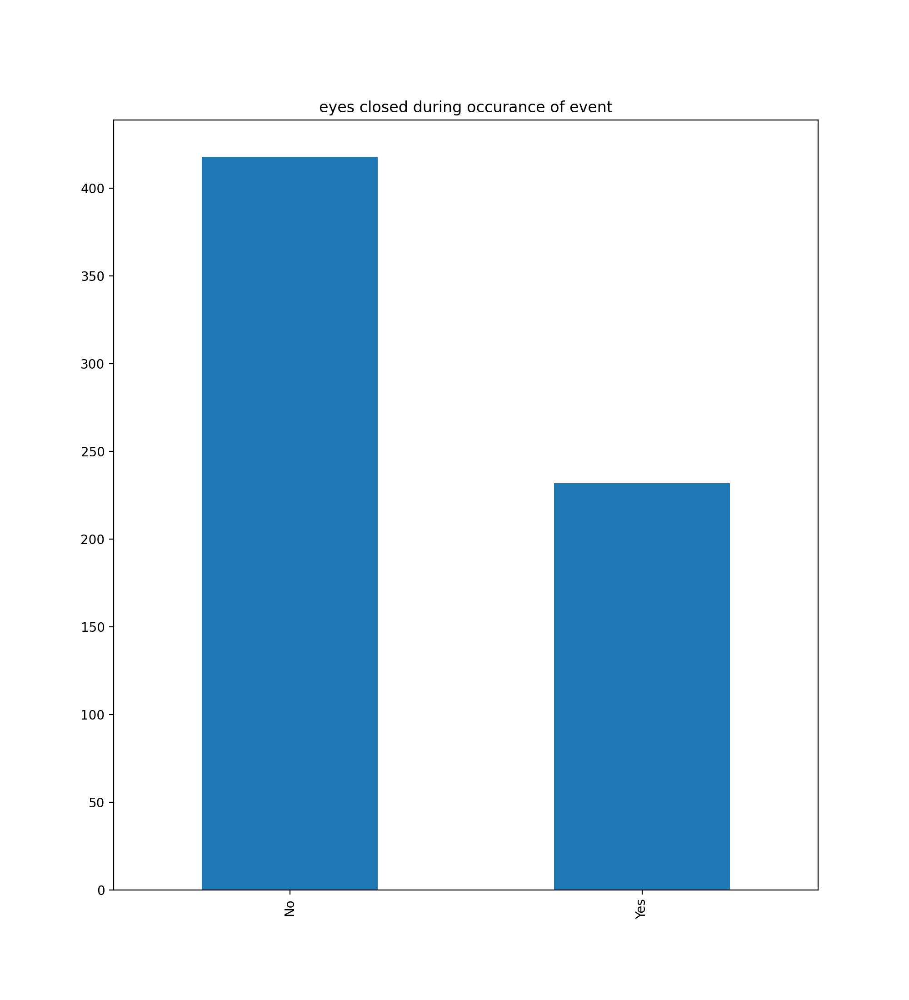

In [189]:
x_corr['eyes_closed_during_event'].value_counts().plot(kind='bar',title="eyes closed during occurance of event")


<Axes: title={'center': 'bitter tongue status of the patients'}>

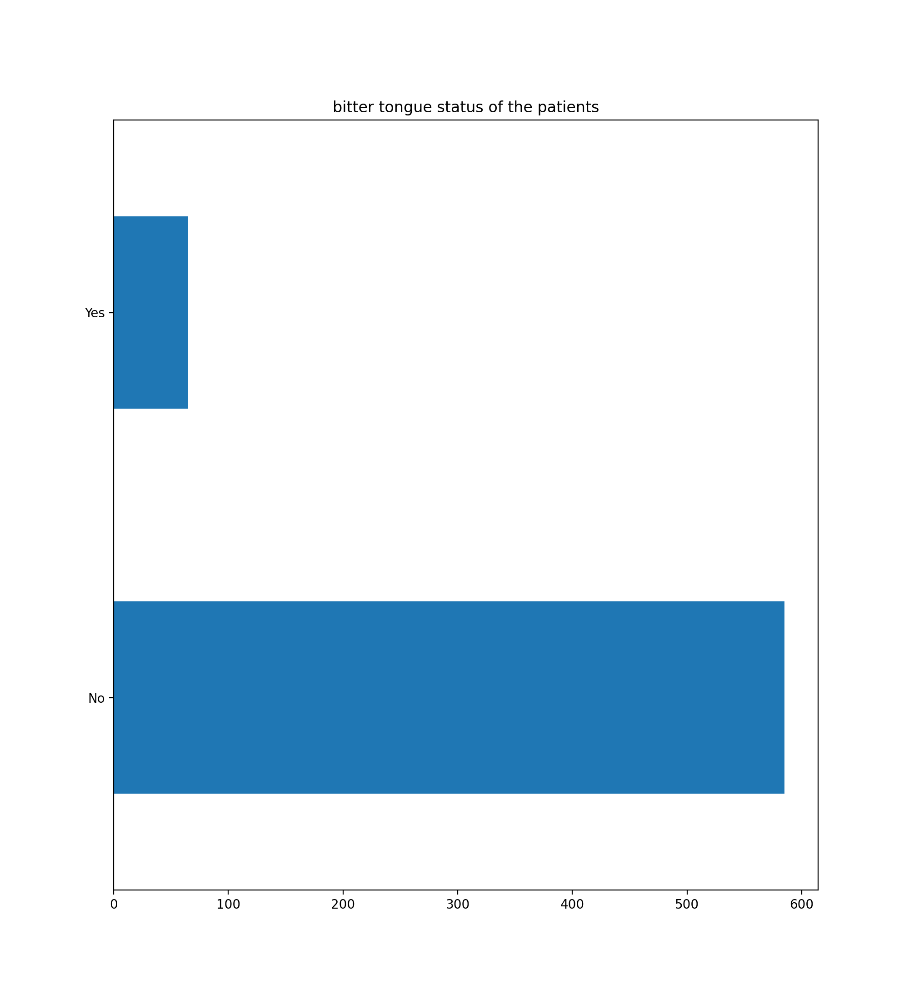

In [190]:
x_corr['bittentongue Yes, side of tongue'].value_counts().plot(kind='barh',title="bitter tongue status of the patients")


<Axes: title={'center': 'Recovery of the patients'}>

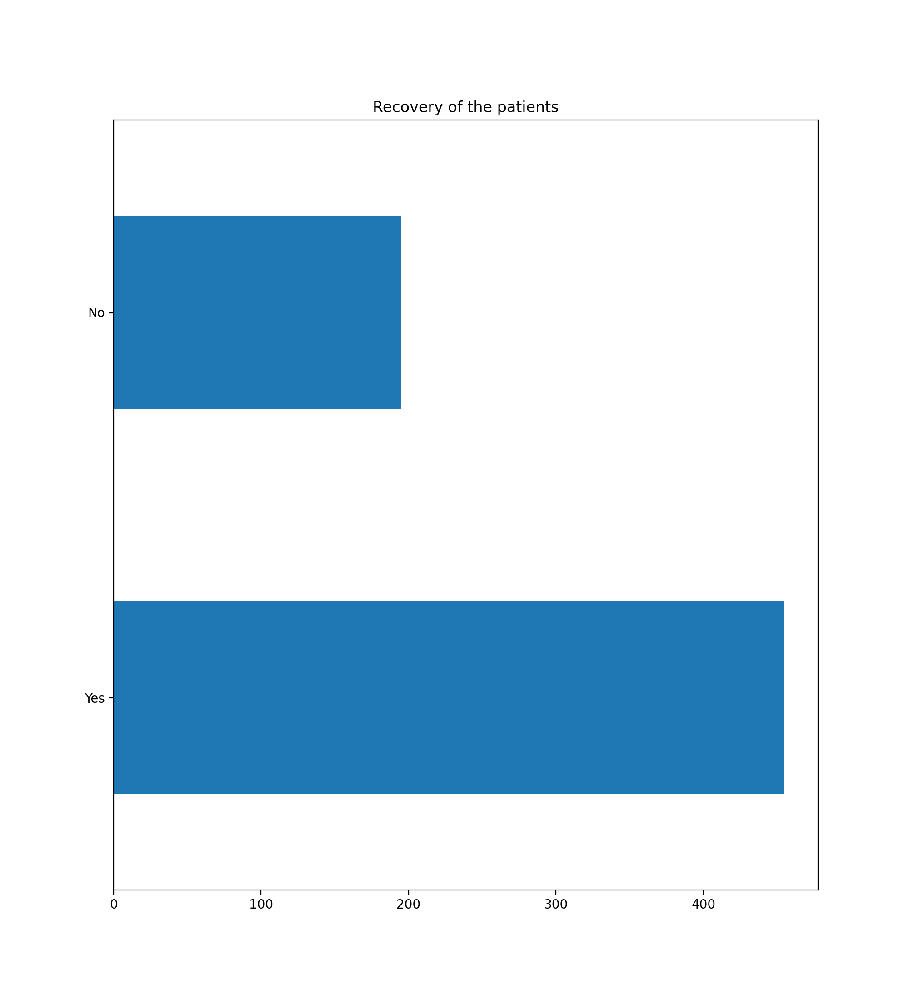

In [191]:
x_corr['recovery Gradual/Slowly'].value_counts().plot(kind='barh',title="Recovery of the patients")

<Axes: title={'center': 'Final Diagnosis'}>

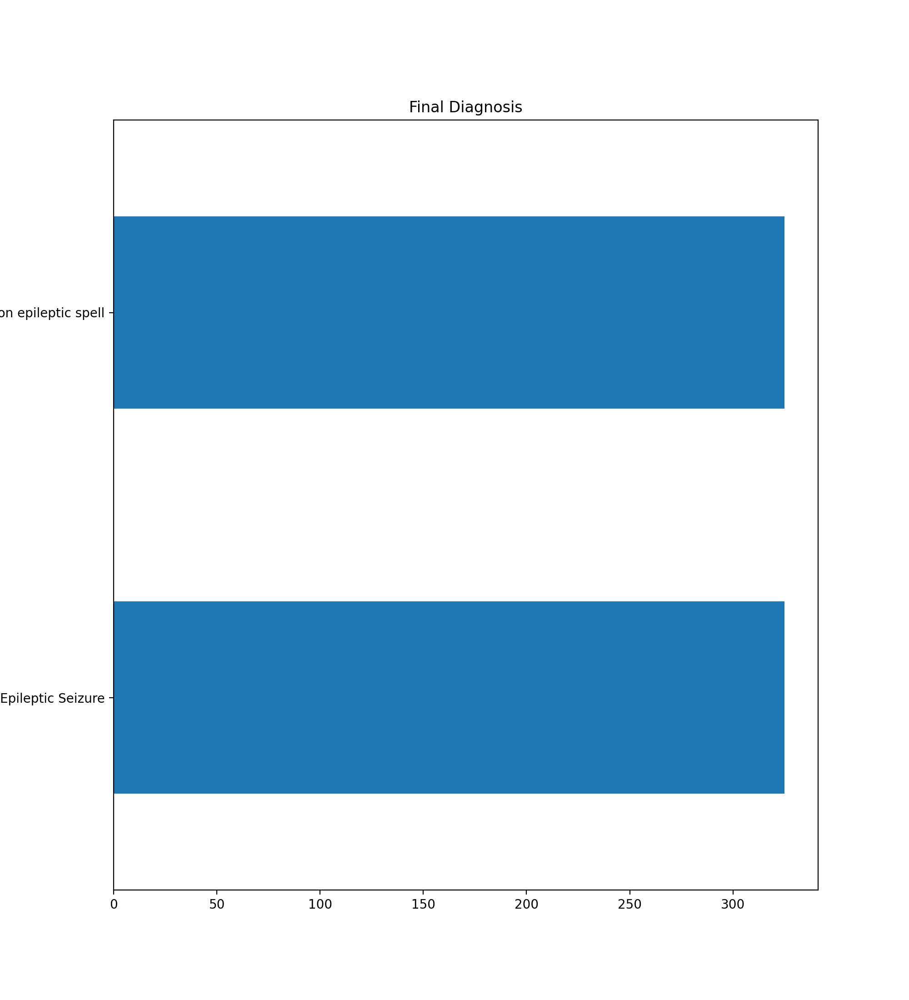

In [192]:
x_corr['Final_Diagnosis'].value_counts().plot(kind='barh',title="Final Diagnosis")

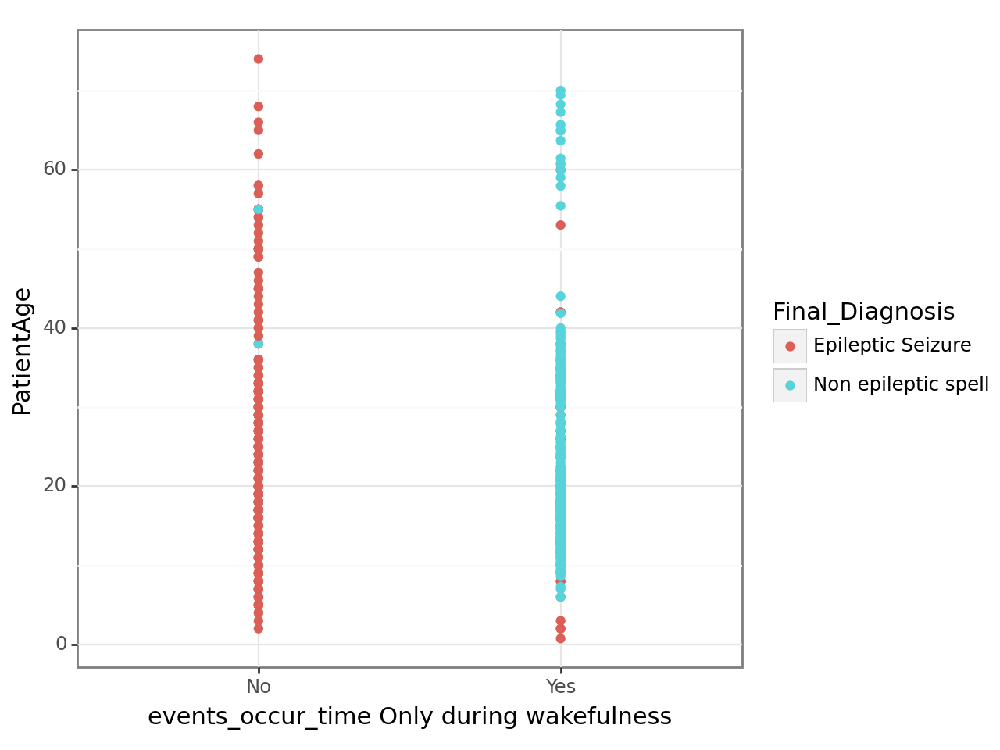

In [193]:
print(
    p9.ggplot(x_corr, p9.aes(x='events_occur_time Only during wakefulness', y='PatientAge')) +
    p9.geom_point(p9.aes(color='Final_Diagnosis')) +
    p9.theme_bw())

In [194]:
#mapping xtraining data
import string

numeric_col=['PatientAge']

numeric_mappings = {}
columns = list(x_train)

#print(columns)
for c in numeric_col:
  if c in columns:
    columns.remove(c)

for col in columns:
  rowval=set()
  for j in x_train[col]:
    rowval.add(j)

  enumval=[k for k in range(len(rowval))]
  x_train[col].replace(list(rowval),enumval,inplace =True)
  x_train_smote[col].replace(list(rowval),enumval,inplace =True)
  x_test[col].replace(list(rowval),enumval,inplace =True)

  ind = 0
  for rowvals in rowval:
    numeric_mappings[rowvals] = enumval[ind]
    ind+=1



In [195]:
x_train_smote

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only during wakefulness,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,recovery Responsive during spell,recovery Gradual/Slowly,recovery Didn’t recover went back to sleep,recovery Abrupt/Sudden (less than a minute),bittentongue No,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue"
0,24.000000,0,0,0,0,0,0,0,0,1,...,0,0,1,0,1,0,0,0,0,1
1,21.000000,1,0,1,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,1
2,27.000000,1,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0
3,5.000000,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0
4,54.000000,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
645,15.065012,1,1,0,1,1,0,0,0,0,...,1,0,0,0,1,0,0,1,0,0
646,25.497780,0,1,0,0,0,0,0,1,0,...,1,0,0,0,0,0,1,1,0,0
647,33.716058,1,1,0,0,0,0,1,0,0,...,1,0,0,0,1,0,0,1,0,0
648,36.012949,0,1,0,0,0,0,0,1,0,...,1,0,0,1,0,0,0,1,0,0


In [196]:
#numeric mapping y column
# mapping to numerical value
numeric_mappings = {}

for col in y_train:
  rowval=set()
  for j in y_train:
    rowval.add(j)

  enumval=[k for k in range(len(rowval))]
  ind = 0
  for rowvals in rowval:
    numeric_mappings[rowvals] = enumval[ind]
    ind+=1
  y_train = [numeric_mappings[v] for v in y_train]
  y_train_smote = [numeric_mappings[v] for v in y_train_smote]
  y_test = [numeric_mappings[v] for v in y_test]


In [ ]:
# accuracy_dict={
#     'Random Forest':list(),
#     'Logistic Regression':list(),
#     'SVC':list(),
#     'Decision Tree':list(),
#     'KNN':list()}

In [197]:
x_test_df = x_test.copy()
# x_test_df['Final_Diagnosis'] = y_train
x_test_df.to_excel("/content/Testing_data.xlsx")

In [198]:
x_train_df = x_train_smote.copy()
#x_train_df['Final_Diagnosis'] = y_train
x_train_df.to_excel("/content/Training data.xlsx")

In [ ]:
#xgb after balanced
# plot feature importance using built-in function
# from numpy import loadtxt
# from xgboost import XGBClassifier
# from xgboost import plot_importance
# from matplotlib import pyplot

# model = XGBClassifier()
# model.fit(x_train_smote, y_train_smote)
# # plot feature importance
# correlations['fscore']=model.feature_importances_
# plot_importance(model)
# pyplot.rcParams['figure.figsize'] = [10, 10]
# pyplot.show()

In [ ]:
# xbg before balacing
# model = XGBClassifier()
# model.fit(x_train, y_train)

# correlations['fscore']=model.feature_importances_
# plot_importance(model)
# pyplot.rcParams['figure.figsize'] = [10, 10]
# pyplot.show()

In [199]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_regression

fs = SelectKBest(score_func=chi2, k='all')
fs.fit(x_train, y_train)


SelectKBest(k='all', score_func=<function chi2 at 0x790d217a8ee0>)

In [200]:
fs.scores_

array([1.98479845e-01, 2.73476532e+00, 1.21078958e+02, 2.42138678e+01,
       6.02296165e+01, 7.55446166e+01, 9.90179848e-01, 5.44631234e+01,
       3.14397412e+01, 1.26707692e+01, 6.33538462e+00, 6.21457946e+00,
       2.28819068e+00, 2.56504922e+01, 3.90744890e+01, 7.78218852e-01,
       9.61230769e+00, 1.35904659e-01, 9.53412784e-04, 3.62009526e+00,
       3.07471256e+01, 4.55037920e-02, 1.02028904e+01, 6.41040087e-01,
       2.25015385e+01, 1.24477714e+01, 7.50942579e-01, 8.51483889e+01,
       7.97536341e+00, 3.55748394e+01, 6.10269989e+01, 1.35228289e+01,
       6.31543105e-02, 1.83804117e+01, 7.42081603e+00, 6.47143662e+00,
       1.42000000e+01])

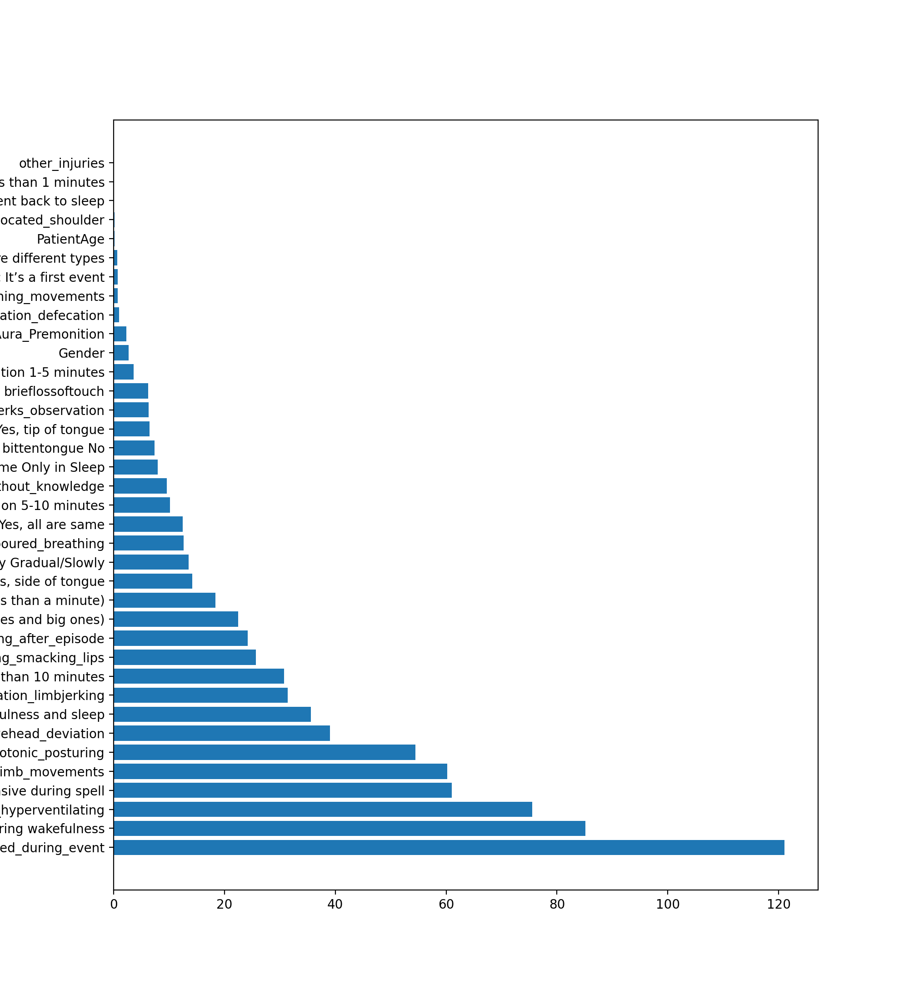

In [201]:
from matplotlib import pyplot
feature = []
for f in x_train.keys():
  feature.append(f)

f_mp = pd.Series()

for i in range(len(feature)):
  f_mp[feature[i]] = fs.scores_[i]

f_mp = f_mp.sort_values(ascending = False)

sc = []
feature = []

for k in f_mp.keys():
  feature.append(k)
  sc.append(f_mp[k])

pyplot.barh([feature[i] for i in range(len(fs.scores_))], sc)
pyplot.rcParams['figure.figsize'] = [10, 10]
pyplot.show()

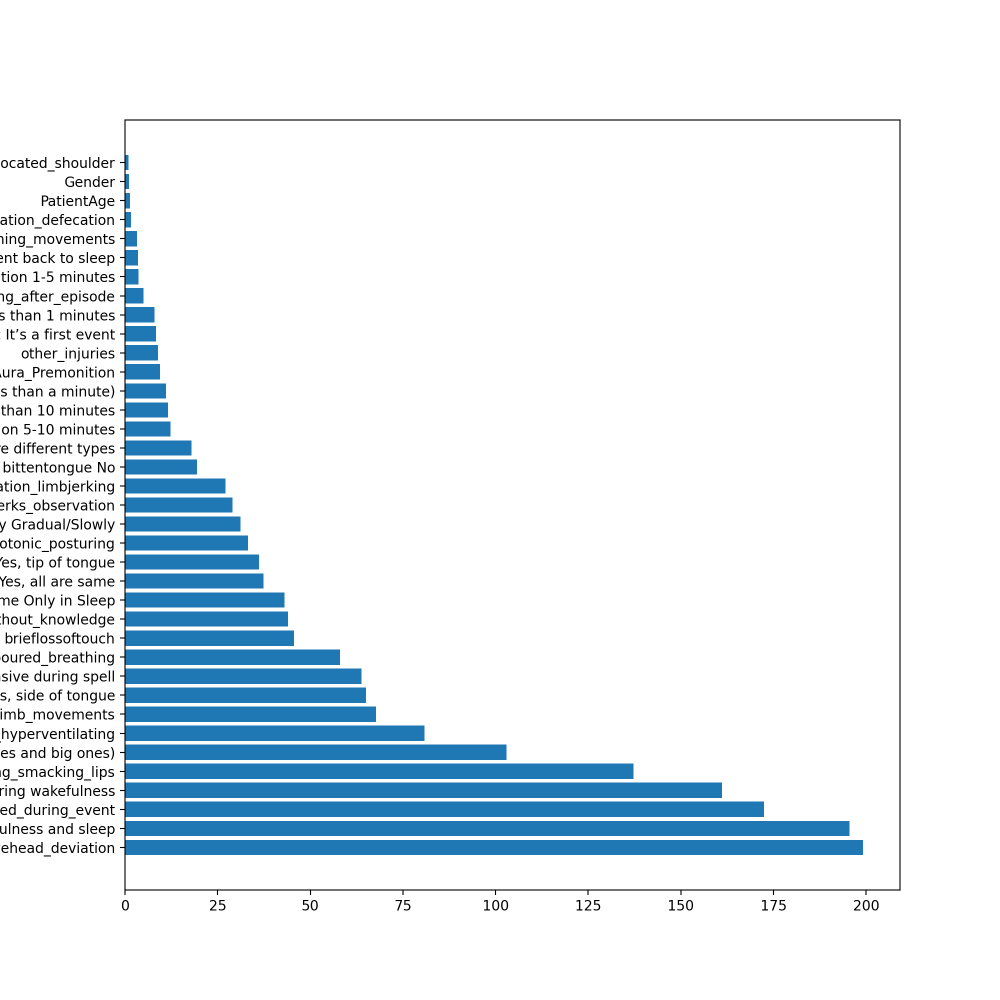

In [202]:
correlations['fscore'] = []

fs.fit(x_train_smote, y_train_smote)

for i in range(len(fs.scores_)):
	correlations['fscore'].append(fs.scores_[i])

feature = []
for f in x_train.keys():
  feature.append(f)

f_mp = pd.Series()

for i in range(len(feature)):
  f_mp[feature[i]] = fs.scores_[i]

f_mp = f_mp.sort_values(ascending = False)

sc = []
feature = []

for k in f_mp.keys():
  feature.append(k)
  sc.append(f_mp[k])

pyplot.barh([feature[i] for i in range(len(fs.scores_))], sc)
pyplot.rcParams['figure.figsize'] = [10, 10]
pyplot.show()

In [203]:
# correlation_df=[]
# correlation_df.append(pd.DataFrame(correlations['original']))
# correlation_df.append(pd.DataFrame(correlations['smote']))
# correlation_df.append(pd.DataFrame(correlations['fscore']))

len(compare_original_smote)

38

In [204]:
len(correlations['fscore'])

37

In [205]:
del compare_original_smote['Final_Diagnosis']
# correlations['smote'].drop('Final_Diagnosis', inplace = True)

len(compare_original_smote)

37

In [206]:
# after this snippet,
# 0 - f
# 1 - smote corr
# 2 - train corr

ind = 0

for k in compare_original_smote.keys():
  compare_original_smote[k].append(correlations['fscore'][ind])
  ind+=1

for array in compare_original_smote.values():
  array[0], array[2] = array[2], array[0]

sorted_value_index = np.argsort(compare_original_smote.values())
dictionary_keys = list(compare_original_smote.keys())
sorted_dict = {dictionary_keys[i]: sorted(
    compare_original_smote.values())[i] for i in range(len(dictionary_keys))}

print(sorted_dict)

{'PatientAge': [1.0, 0.0, 0.0], 'Gender': [1.0588235294117647, 0.034734780961649364, 0.09514310407148238], 'eyes_closed_during_event': [1.4049886231988715, 0.017401626405442926, 0.008115421761372456], 'weeping_before_during_after_episode': [1.6, 0.0, 0.0], 'patient_fall_suddenly_without_limb_movements': [3.2666666666666666, 0.047351349365880896, 0.0], 'Was_patient_hyperventilating': [3.5714285714285716, 0.04491148495089029, 0.0], 'loss_consciousness_after_urination_defecation': [3.6613861386138615, 0.15028006988988657, 0.20120850920628947], 'side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing': [5.0, 0.06996629322001313, 0.22969402035317446], 'observation_limbjerking': [8.0, 0.10251191840775326, 0.0], 'observe_postevent_stridulous_laboured_breathing': [8.333333333333334, 0.09514754064752744, 0.0], 'upper_limb_jerks_observation': [8.909090909090908, 0.10347879746085344, 0.0], 'brieflossoftouch': [9.382978723404255, 0.13356844795390993, 0.06997703928136088], 'fixed_Aura_Pre

In [207]:
sorted_pd = pd.DataFrame(sorted_dict)
sorted_pd

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only during wakefulness,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,recovery Responsive during spell,recovery Gradual/Slowly,recovery Didn’t recover went back to sleep,recovery Abrupt/Sudden (less than a minute),bittentongue No,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue"
0,1.0,1.058824,1.404989,1.6,3.266667,3.571429,3.661386,5.000000,8.000000,8.333333,...,63.810127,65.000000,67.700855,80.842105,103.000000,137.241611,161.082474,172.413793,195.465116,199.170616
1,0.0,0.034735,0.017402,0.0,0.047351,0.044911,0.150280,0.069966,0.102512,0.095148,...,0.327491,0.326101,0.350469,0.382601,0.428256,0.518644,0.780582,0.638315,0.666420,0.669646
2,0.0,0.095143,0.008115,0.0,0.000000,0.000000,0.201209,0.229694,0.000000,0.000000,...,0.386805,0.191989,0.397727,0.443572,0.265219,0.311817,0.561585,0.588757,0.434370,0.450750


In [208]:
less_f = []
for col in sorted_pd:
  if sorted_pd[col][0]<0.05:
    less_f.append(col)


In [209]:
intersection_f_cor = []
for ele in less_correlation:
  if ele in less_f:
    intersection_f_cor.append(ele)

In [78]:
sorted_pd.drop(intersection_f_cor, axis = 1, inplace = True)
sorted_pd

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only during wakefulness,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,recovery Responsive during spell,recovery Gradual/Slowly,recovery Didn’t recover went back to sleep,recovery Abrupt/Sudden (less than a minute),bittentongue No,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue"
0,1.0,1.058824,1.404989,1.6,3.266667,3.571429,3.661386,5.000000,8.000000,8.333333,...,63.810127,65.000000,67.700855,80.842105,103.000000,137.241611,161.082474,172.413793,195.465116,199.170616
1,0.0,0.034735,0.017402,0.0,0.047351,0.044911,0.150280,0.069966,0.102512,0.095148,...,0.327491,0.326101,0.350469,0.382601,0.428256,0.518644,0.780582,0.638315,0.666420,0.669646
2,0.0,0.095143,0.008115,0.0,0.000000,0.000000,0.201209,0.229694,0.000000,0.000000,...,0.386805,0.191989,0.397727,0.443572,0.265219,0.311817,0.561585,0.588757,0.434370,0.450750


In [210]:
print(less_f)
print(less_correlation)
print(intersection_f_cor)

[]
['PatientAge', 'Gender', 'loss_consciousness_after_urination_defecation', 'violent_thrashing_movements', 'dislocated_shoulder', 'recovery Didn’t recover went back to sleep']
[]


In [211]:
sorted_pd

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only during wakefulness,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,recovery Responsive during spell,recovery Gradual/Slowly,recovery Didn’t recover went back to sleep,recovery Abrupt/Sudden (less than a minute),bittentongue No,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue"
0,1.0,1.058824,1.404989,1.6,3.266667,3.571429,3.661386,5.000000,8.000000,8.333333,...,63.810127,65.000000,67.700855,80.842105,103.000000,137.241611,161.082474,172.413793,195.465116,199.170616
1,0.0,0.034735,0.017402,0.0,0.047351,0.044911,0.150280,0.069966,0.102512,0.095148,...,0.327491,0.326101,0.350469,0.382601,0.428256,0.518644,0.780582,0.638315,0.666420,0.669646
2,0.0,0.095143,0.008115,0.0,0.000000,0.000000,0.201209,0.229694,0.000000,0.000000,...,0.386805,0.191989,0.397727,0.443572,0.265219,0.311817,0.561585,0.588757,0.434370,0.450750


In [212]:
x_train.drop(intersection_f_cor, axis=1,inplace=True)
x_test.drop(intersection_f_cor, axis=1,inplace=True)
x_train_smote.drop(intersection_f_cor, axis=1,inplace=True)

In [213]:
x_test

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only during wakefulness,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,recovery Responsive during spell,recovery Gradual/Slowly,recovery Didn’t recover went back to sleep,recovery Abrupt/Sudden (less than a minute),bittentongue No,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue"
462,71.0,1,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0
73,77.0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,1,0,0,1,0,0
231,17.0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,1,0,0
175,13.0,1,0,0,1,0,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0
237,18.0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,26.0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,1
383,7.0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0
19,32.0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0
320,22.0,1,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0


In [214]:
x_test = x_test.replace('Yes', 1)


In [215]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score


accuracy_df = pd.DataFrame(columns=['Model','Before Smote','K fold before smote','confusion matrix before','Sensitivity before smote','Specificity before smote','After Smote','K fold after smote','Sensitivity after smote','Specificity after smote','confusion matrix after'])
dict_classifiers = {'Random Forest': RandomForestClassifier(),
                    'Logistic Regression': LogisticRegression(),
                    'SVC': SVC(),
                    'Decision Tree': DecisionTreeClassifier(),
                    'KNN': KNeighborsClassifier()
                    }
for clf_name, clf in dict_classifiers.items():
  #for validation
  cv = KFold(n_splits=10, random_state=42, shuffle=True)

  #before smote
  clf.fit(x_train, y_train)
  prediction1 = clf.predict(x_test)
  score1=accuracy_score(prediction1, y_test)
  fold_score1 = cross_val_score(clf, x_train, y_train, cv=cv)

  #confusion matrix
  cm1 = metrics.confusion_matrix(y_test, prediction1)
  cm_df1 = pd.DataFrame(cm1,
            columns = ['Predicted Negative', 'Predicted Positive'],
            index = ['Actual Negative', 'Actual Positive'])

  TP = cm1[1][1]
  TN = cm1[0][0]
  FP = cm1[0][1]
  FN = cm1[1][0]
  conf_sensitivity1 = (TP / float(TP + FN))
  conf_specificity1 = (TN / float(TN + FP))


  #after smote
  clf.fit(x_train_smote, y_train_smote)
  prediction2 = clf.predict(x_test)
  score2=accuracy_score(prediction2, y_test)
  fold_score2 = cross_val_score(clf, x_train_smote, y_train_smote, cv=cv)
  cm2 = metrics.confusion_matrix(y_test, prediction2)
  cm_df2 = pd.DataFrame(cm2,
            columns = ['Predicted Negative', 'Predicted Positive'],
            index = ['Actual Negative', 'Actual Positive'])

  TP = cm2[1][1]
  TN = cm2[0][0]
  FP = cm2[0][1]
  FN = cm2[1][0]

  conf_sensitivity2 = (TP / float(TP + FN))
  conf_specificity2 = (TN / float(TN + FP))

  # print(clf_name)
  # print("Before smote ",fold_score1,'\n',fold_score1.mean())
  # print("After smote ",fold_score2,'\n',fold_score2.mean(),'\n')

  new_row={
      'Model':clf_name,
       'Before Smote':score1,
       'K fold before smote':fold_score1.mean(),
       'confusion matrix before':cm_df1,
       'Sensitivity before smote':conf_sensitivity1,
       'Specificity before smote': conf_specificity1,
       'After Smote':score2 ,
       'K fold after smote': fold_score2.mean(),
       'Sensitivity after smote':conf_sensitivity2,
       'Specificity after smote': conf_specificity2,
       'confusion matrix after':cm_df2
  }
  accuracy_df=accuracy_df.append(new_row, ignore_index=True)

  # accuracy_dict[clf_name].append(score1)
  #print(clf_name,score1)
  # score2=accuracy_score(prediction2, y_test)
  # accuracy_dict[clf_name].append(score2)
  #print(clf_name,score2)


accuracy_df

,Model,Before Smote,K fold before smote,confusion matrix before,Sensitivity before smote,Specificity before smote,After Smote,K fold after smote,Sensitivity after smote,Specificity after smote,confusion matrix after
0,Random Forest,0.94,0.959744,Predicted Negative Predicted...,0.974359,0.818182,0.94,0.978462,0.974359,0.818182,Predicted Negative Predicted...
1,Logistic Regression,0.95,0.962179,Predicted Negative Predicted...,0.987179,0.818182,0.95,0.973846,0.974359,0.863636,Predicted Negative Predicted...
2,SVC,0.78,0.820705,Predicted Negative Predicted...,1.000000,0.000000,0.83,0.904615,0.846154,0.772727,Predicted Negative Predicted...
3,Decision Tree,0.88,0.904038,Predicted Negative Predicted...,0.897436,0.818182,0.86,0.960000,0.948718,0.545455,Predicted Negative Predicted...
4,KNN,0.91,0.919295,Predicted Negative Predicted...,1.000000,0.590909,0.80,0.938462,0.833333,0.681818,Predicted Negative Predicted...


In [216]:
accuracy_df.to_excel("/content/Results.xlsx")

In [217]:
import pandas as pd
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

def calculate_k_fold_score_and_confidence(clf, x_train, y_train, x_test):
    cv = KFold(n_splits=10, random_state=42, shuffle=True)
    fold_scores = cross_val_score(clf, x_train, y_train, cv=cv)

    clf.fit(x_train, y_train)

    if hasattr(clf, 'predict_proba'):
        confidence_scores = clf.predict_proba(x_test)
    elif hasattr(clf, 'decision_function'):
        decision_scores = clf.decision_function(x_test)
        confidence_scores = (decision_scores - decision_scores.min()) / (decision_scores.max() - decision_scores.min())
    else:
        raise ValueError("Classifier does not support either predict_proba or decision_function.")

    return fold_scores, confidence_scores

# Initialize an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['Model', 'Data', 'K-Fold Value', 'Confidence Score'])

for clf_name, clf in dict_classifiers.items():
    # Calculate k-fold scores and confidence scores for testing data
    fold_scores, confidence_scores = calculate_k_fold_score_and_confidence(clf, x_train, y_train, x_test)

    # Add results to the DataFrame
    for fold_num, (k_fold_score, confidence_score) in enumerate(zip(fold_scores, confidence_scores), start=1):
        result_row = {
            'Model': clf_name,
            'Data': 'Test',
            'K-Fold Value': k_fold_score,
            'Confidence Score': confidence_score
        }
        results_df = results_df.append(result_row, ignore_index=True)

# Display the combined results
print(results_df)
# Calculate the average values for each model
average_results = results_df.groupby('Model').mean().reset_index()

# Calculate the average Confidence Score for each model
average_confidence_scores = results_df.groupby('Model')['Confidence Score'].mean().reset_index()

# Merge the two DataFrames to include the average Confidence Score
average_results = pd.merge(average_results, average_confidence_scores, on='Model')

# Display the average results
print(average_results)



                  Model  Data  K-Fold Value  \
0         Random Forest  Test      0.950000   
1         Random Forest  Test      0.950000   
2         Random Forest  Test      0.975000   
3         Random Forest  Test      1.000000   
4         Random Forest  Test      0.900000   
5         Random Forest  Test      0.950000   
6         Random Forest  Test      1.000000   
7         Random Forest  Test      0.974359   
8         Random Forest  Test      0.974359   
9         Random Forest  Test      1.000000   
10  Logistic Regression  Test      0.950000   
11  Logistic Regression  Test      0.950000   
12  Logistic Regression  Test      0.975000   
13  Logistic Regression  Test      1.000000   
14  Logistic Regression  Test      0.950000   
15  Logistic Regression  Test      0.925000   
16  Logistic Regression  Test      0.974359   
17  Logistic Regression  Test      0.974359   
18  Logistic Regression  Test      0.923077   
19  Logistic Regression  Test      1.000000   
20           

In [218]:
print(x_train.columns)



Index(['PatientAge', 'Gender', 'eyes_closed_during_event',
       'weeping_before_during_after_episode',
       'patient_fall_suddenly_without_limb_movements',
       'Was_patient_hyperventilating',
       'loss_consciousness_after_urination_defecation',
       'side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing',
       'observation_limbjerking',
       'observe_postevent_stridulous_laboured_breathing',
       'upper_limb_jerks_observation', 'brieflossoftouch',
       'fixed_Aura_Premonition', 'staring_blankly_chewing_smacking_lips',
       'posturing_limbeyehead_deviation', 'violent_thrashing_movements',
       'urine_without_knowledge', 'dislocated_shoulder', 'other_injuries',
       'EventDuration 1-5 minutes', 'EventDuration More than 10 minutes',
       'EventDuration Less than 1 minutes', 'EventDuration 5-10 minutes',
       'Stereotypic No, they are different types',
       'Stereotypic Two different types (small ones and big ones)',
       'Stereotypic Yes, all 

In [219]:
# before smote
import pandas as pd
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

testing_data = pd.read_excel("/content/Copy of Testing_data(2).xlsx")
testing_data.drop(testing_data .columns[0], axis=1, inplace=True)
testing_data.rename(columns={'side-to-side_head_nodding_pelvic_thrusting_Opisthotonic_posturing': 'side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing'}, inplace=True)
# Get the column order from x_train
column_order = x_train.columns.tolist()

# Reorder the columns in testing_data to match the order in x_train
testing_data = testing_data[column_order]


def calculate_k_fold_score_and_confidence(clf, x_train, y_train, testing_data):
    cv = KFold(n_splits=10, random_state=42, shuffle=True)
    fold_scores = cross_val_score(clf, x_train, y_train, cv=cv)

    clf.fit(x_train, y_train)

    if hasattr(clf, 'predict_proba'):
        confidence_scores = clf.predict_proba(testing_data)
    elif hasattr(clf, 'decision_function'):
        decision_scores = clf.decision_function(testing_data)
        confidence_scores = (decision_scores - decision_scores.min()) / (decision_scores.max() - decision_scores.min())
    else:
        raise ValueError("Classifier does not support either predict_proba or decision_function.")

    return fold_scores, confidence_scores

# Initialize an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['Model', 'Data', 'K-Fold Value', 'Confidence Score'])

for clf_name, clf in dict_classifiers.items():
    # Calculate k-fold scores and confidence scores for testing data
    fold_scores, confidence_scores = calculate_k_fold_score_and_confidence(clf, x_train, y_train, testing_data)

    # Add results to the DataFrame
    for fold_num, (k_fold_score, confidence_score) in enumerate(zip(fold_scores, confidence_scores), start=1):
        result_row = {
            'Model': clf_name,
            'Data': 'Test',
            'K-Fold Value': k_fold_score,
            'Confidence Score': confidence_score
        }
        results_df = results_df.append(result_row, ignore_index=True)

# Display the combined results
print(results_df)
# Calculate the average values for each model
average_results = results_df.groupby('Model').mean().reset_index()

# Calculate the average Confidence Score for each model
average_confidence_scores = results_df.groupby('Model')['Confidence Score'].mean().reset_index()

# Merge the two DataFrames to include the average Confidence Score
average_results = pd.merge(average_results, average_confidence_scores, on='Model')

# Display the average results
print(average_results)



                  Model  Data  K-Fold Value  \
0         Random Forest  Test      0.950000   
1         Random Forest  Test      0.950000   
2         Random Forest  Test      0.975000   
3         Random Forest  Test      1.000000   
4         Random Forest  Test      0.900000   
5         Random Forest  Test      0.950000   
6         Random Forest  Test      1.000000   
7         Random Forest  Test      0.923077   
8         Random Forest  Test      0.923077   
9         Random Forest  Test      0.974359   
10  Logistic Regression  Test      0.950000   
11  Logistic Regression  Test      0.950000   
12  Logistic Regression  Test      0.975000   
13  Logistic Regression  Test      1.000000   
14  Logistic Regression  Test      0.950000   
15  Logistic Regression  Test      0.925000   
16  Logistic Regression  Test      0.974359   
17  Logistic Regression  Test      0.974359   
18  Logistic Regression  Test      0.923077   
19  Logistic Regression  Test      1.000000   
20           

In [220]:
import pandas as pd
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

testing_data = pd.read_excel("/content/Copy of Testing_data(2).xlsx")
testing_data.drop(testing_data .columns[0], axis=1, inplace=True)
testing_data.rename(columns={'side-to-side_head_nodding_pelvic_thrusting_Opisthotonic_posturing': 'side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing'}, inplace=True)
# Get the column order from x_train
column_order = x_train.columns.tolist()

# Reorder the columns in testing_data to match the order in x_train
testing_data = testing_data[column_order]


def calculate_k_fold_score_and_confidence(clf, x_train_smote, y_train_smote, testing_data):
    cv = KFold(n_splits=10, random_state=42, shuffle=True)
    fold_scores = cross_val_score(clf, x_train_smote, y_train_smote, cv=cv)

    clf.fit(x_train_smote, y_train_smote)

    if hasattr(clf, 'predict_proba'):
        confidence_scores = clf.predict_proba(testing_data)
    elif hasattr(clf, 'decision_function'):
        decision_scores = clf.decision_function(testing_data)
        confidence_scores = (decision_scores - decision_scores.min()) / (decision_scores.max() - decision_scores.min())
    else:
        raise ValueError("Classifier does not support either predict_proba or decision_function.")

    return fold_scores, confidence_scores

# Initialize an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['Model', 'Data', 'K-Fold Value', 'Confidence Score'])

for clf_name, clf in dict_classifiers.items():
    # Calculate k-fold scores and confidence scores for testing data
    fold_scores, confidence_scores = calculate_k_fold_score_and_confidence(clf, x_train_smote, y_train_smote, testing_data)

    # Add results to the DataFrame
    for fold_num, (k_fold_score, confidence_score) in enumerate(zip(fold_scores, confidence_scores), start=1):
        result_row = {
            'Model': clf_name,
            'Data': 'Test',
            'K-Fold Value': k_fold_score,
            'Confidence Score': confidence_score
        }
        results_df = results_df.append(result_row, ignore_index=True)

# Display the combined results
print(results_df)

# Calculate the average values for each model
average_results = results_df.groupby('Model').mean().reset_index()

# Calculate the average Confidence Score for each model
average_confidence_scores = results_df.groupby('Model')['Confidence Score'].mean().reset_index()

# Merge the two DataFrames to include the average Confidence Score
average_results = pd.merge(average_results, average_confidence_scores, on='Model')

# Display the average results
print(average_results)



                  Model  Data  K-Fold Value  \
0         Random Forest  Test      0.969231   
1         Random Forest  Test      0.984615   
2         Random Forest  Test      0.984615   
3         Random Forest  Test      0.984615   
4         Random Forest  Test      0.969231   
5         Random Forest  Test      0.969231   
6         Random Forest  Test      0.984615   
7         Random Forest  Test      0.969231   
8         Random Forest  Test      0.969231   
9         Random Forest  Test      0.984615   
10  Logistic Regression  Test      0.969231   
11  Logistic Regression  Test      0.984615   
12  Logistic Regression  Test      0.984615   
13  Logistic Regression  Test      0.969231   
14  Logistic Regression  Test      0.969231   
15  Logistic Regression  Test      0.953846   
16  Logistic Regression  Test      0.969231   
17  Logistic Regression  Test      0.953846   
18  Logistic Regression  Test      0.984615   
19  Logistic Regression  Test      1.000000   
20           

In [221]:
print(testing_data.columns)


Index(['PatientAge', 'Gender', 'eyes_closed_during_event',
       'weeping_before_during_after_episode',
       'patient_fall_suddenly_without_limb_movements',
       'Was_patient_hyperventilating',
       'loss_consciousness_after_urination_defecation',
       'side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing',
       'observation_limbjerking',
       'observe_postevent_stridulous_laboured_breathing',
       'upper_limb_jerks_observation', 'brieflossoftouch',
       'fixed_Aura_Premonition', 'staring_blankly_chewing_smacking_lips',
       'posturing_limbeyehead_deviation', 'violent_thrashing_movements',
       'urine_without_knowledge', 'dislocated_shoulder', 'other_injuries',
       'EventDuration 1-5 minutes', 'EventDuration More than 10 minutes',
       'EventDuration Less than 1 minutes', 'EventDuration 5-10 minutes',
       'Stereotypic No, they are different types',
       'Stereotypic Two different types (small ones and big ones)',
       'Stereotypic Yes, all 

In [222]:
from sklearn.model_selection import KFold, cross_val_predict
import pandas as pd


testing_data = pd.read_excel("/content/Copy of Testing_data(2).xlsx")

def calculate_k_fold_score_and_confidence(clf, x_train_smote, y_train_smote, testing_data):
    cv = KFold(n_splits=10, random_state=42, shuffle=True)
    fold_scores = cross_val_predict(clf, x_train_smote, y_train_smote, cv=cv, method='predict_proba' if hasattr(clf, 'predict_proba') else 'decision_function')

    clf.fit(x_train_smote, y_train_smote)
    if hasattr(clf, 'predict_proba'):
        confidence_scores = clf.predict_proba(testing_data)
    elif hasattr(clf, 'decision_function'):
        confidence_scores = clf.decision_function(testing_data)
        confidence_scores = (confidence_scores - confidence_scores.min()) / (confidence_scores.max() - confidence_scores.min())
    else:
        raise ValueError("Classifier does not support either predict_proba or decision_function.")

    return fold_scores, confidence_scores

# Initialize an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['Model', 'Data', 'K-Fold Value', 'Confidence Score'])


for clf_name, clf in dict_classifiers.items():
    # Calculate k-fold scores and confidence scores for testing data
    fold_scores, confidence_scores = calculate_k_fold_score_and_confidence(clf,x_train_smote, y_train_smote, x_test)

    # Add results to the DataFrame
    for fold_num, (k_fold_score, confidence_score) in enumerate(zip(fold_scores, confidence_scores), start=1):
        result_row = {
            'Model': clf_name,
            'Data': 'Test',
            'K-Fold Value': k_fold_score,
            'Confidence Score': confidence_score
        }
        results_df = results_df.append(result_row, ignore_index=True)

# Display the combined results
print(results_df)
# Calculate the average values for each model
average_results = results_df.groupby('Model').mean().reset_index()

# Calculate the average Confidence Score for each model
average_confidence_scores = results_df.groupby('Model')['Confidence Score'].mean().reset_index()

# Merge the two DataFrames to include the average Confidence Score
average_results = pd.merge(average_results, average_confidence_scores, on='Model')

# Display the average results
print(average_results)



             Model  Data  K-Fold Value Confidence Score
0    Random Forest  Test    [0.0, 1.0]     [0.01, 0.99]
1    Random Forest  Test  [0.17, 0.83]     [0.02, 0.98]
2    Random Forest  Test    [0.0, 1.0]     [0.07, 0.93]
3    Random Forest  Test    [0.0, 1.0]     [0.06, 0.94]
4    Random Forest  Test    [0.0, 1.0]       [0.0, 1.0]
..             ...   ...           ...              ...
495            KNN  Test    [0.6, 0.4]       [0.0, 1.0]
496            KNN  Test    [0.2, 0.8]       [0.0, 1.0]
497            KNN  Test    [0.4, 0.6]       [0.0, 1.0]
498            KNN  Test    [0.0, 1.0]       [0.0, 1.0]
499            KNN  Test    [0.6, 0.4]       [0.0, 1.0]

[500 rows x 4 columns]
                 Model                               K-Fold Value  \
0        Decision Tree                               [0.18, 0.82]   
1                  KNN                [0.256, 0.7439999999999999]   
2  Logistic Regression   [0.2002114572924941, 0.7997885427075062]   
3        Random Forest  [0.1

In [223]:
# before smote
from sklearn.model_selection import KFold, cross_val_predict
import pandas as pd


testing_data = pd.read_excel("/content/Copy of Testing_data(2).xlsx")

def calculate_k_fold_score_and_confidence(clf, x_train, y_train, testing_data):
    cv = KFold(n_splits=10, random_state=42, shuffle=True)
    fold_scores = cross_val_predict(clf, x_train, y_train, cv=cv, method='predict_proba' if hasattr(clf, 'predict_proba') else 'decision_function')

    clf.fit(x_train, y_train)
    if hasattr(clf, 'predict_proba'):
        confidence_scores = clf.predict_proba(testing_data)
    elif hasattr(clf, 'decision_function'):
        confidence_scores = clf.decision_function(testing_data)
        confidence_scores = (confidence_scores - confidence_scores.min()) / (confidence_scores.max() - confidence_scores.min())
    else:
        raise ValueError("Classifier does not support either predict_proba or decision_function.")

    return fold_scores, confidence_scores

# Initialize an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['Model', 'Data', 'K-Fold Value', 'Confidence Score'])


for clf_name, clf in dict_classifiers.items():
    # Calculate k-fold scores and confidence scores for testing data
    fold_scores, confidence_scores = calculate_k_fold_score_and_confidence(clf, x_train, y_train, x_test)

    # Add results to the DataFrame
    for fold_num, (k_fold_score, confidence_score) in enumerate(zip(fold_scores, confidence_scores), start=1):
        result_row = {
            'Model': clf_name,
            'Data': 'Test',
            'K-Fold Value': k_fold_score,
            'Confidence Score': confidence_score
        }
        results_df = results_df.append(result_row, ignore_index=True)

# Display the combined results
print(results_df)
# Calculate the average values for each model
average_results = results_df.groupby('Model').mean().reset_index()

# Display the average results
print(average_results)



             Model  Data  K-Fold Value Confidence Score
0    Random Forest  Test    [0.0, 1.0]       [0.0, 1.0]
1    Random Forest  Test  [0.47, 0.53]     [0.02, 0.98]
2    Random Forest  Test    [0.0, 1.0]     [0.03, 0.97]
3    Random Forest  Test  [0.01, 0.99]     [0.08, 0.92]
4    Random Forest  Test    [0.0, 1.0]       [0.0, 1.0]
..             ...   ...           ...              ...
495            KNN  Test    [0.0, 1.0]       [0.0, 1.0]
496            KNN  Test    [0.0, 1.0]       [0.0, 1.0]
497            KNN  Test    [0.2, 0.8]       [0.0, 1.0]
498            KNN  Test    [0.0, 1.0]       [0.0, 1.0]
499            KNN  Test    [0.4, 0.6]       [0.0, 1.0]

[500 rows x 4 columns]
                 Model                               K-Fold Value  \
0        Decision Tree                                 [0.2, 0.8]   
1                  KNN               [0.18200000000000002, 0.818]   
2  Logistic Regression  [0.17759617800643526, 0.8224038219935649]   
3        Random Forest      

In [224]:
# before smote
from sklearn.model_selection import KFold, cross_val_predict
import pandas as pd


testing_data = pd.read_excel("/content/Copy of Testing_data(2).xlsx")
# Combine x_train and x_test
x_train_combined = pd.concat([x_train, x_test])

# Combine y_train and y_test into a single list
y_train_combined = y_train + y_test

# Convert the combined list to a Pandas Series
y_train_combined = pd.Series(y_train_combined)


# Reset the index for combined DataFrames
x_train_combined.reset_index(drop=True, inplace=True)


def calculate_k_fold_score_and_confidence(clf, x_train, y_train, testing_data):
    cv = KFold(n_splits=10, random_state=42, shuffle=True)
    fold_scores = cross_val_predict(clf, x_train_combined, y_train_combined, cv=cv, method='predict_proba' if hasattr(clf, 'predict_proba') else 'decision_function')

    clf.fit(x_train_combined, y_train_combined)
    if hasattr(clf, 'predict_proba'):
        confidence_scores = clf.predict_proba(testing_data)
    elif hasattr(clf, 'decision_function'):
        confidence_scores = clf.decision_function(testing_data)
        confidence_scores = (confidence_scores - confidence_scores.min()) / (confidence_scores.max() - confidence_scores.min())
    else:
        raise ValueError("Classifier does not support either predict_proba or decision_function.")

    return fold_scores, confidence_scores

# Initialize an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['Model', 'Data', 'K-Fold Value', 'Confidence Score'])


for clf_name, clf in dict_classifiers.items():
    # Calculate k-fold scores and confidence scores for testing data
    fold_scores, confidence_scores = calculate_k_fold_score_and_confidence(clf, x_train_combined, y_train_combined, x_test)

    # Add results to the DataFrame
    for fold_num, (k_fold_score, confidence_score) in enumerate(zip(fold_scores, confidence_scores), start=1):
        result_row = {
            'Model': clf_name,
            'Data': 'Test',
            'K-Fold Value': k_fold_score,
            'Confidence Score': confidence_score
        }
        results_df = results_df.append(result_row, ignore_index=True)

# Display the combined results
print(results_df)
# Calculate the average values for each model
average_results = results_df.groupby('Model').mean().reset_index()

# Display the average results
print(average_results)



             Model  Data  K-Fold Value Confidence Score
0    Random Forest  Test    [0.0, 1.0]       [0.0, 1.0]
1    Random Forest  Test  [0.36, 0.64]       [0.0, 1.0]
2    Random Forest  Test  [0.02, 0.98]     [0.03, 0.97]
3    Random Forest  Test    [0.0, 1.0]     [0.02, 0.98]
4    Random Forest  Test    [0.0, 1.0]       [0.0, 1.0]
..             ...   ...           ...              ...
495            KNN  Test    [0.0, 1.0]       [0.0, 1.0]
496            KNN  Test    [0.0, 1.0]       [0.0, 1.0]
497            KNN  Test    [0.2, 0.8]       [0.0, 1.0]
498            KNN  Test    [0.0, 1.0]       [0.0, 1.0]
499            KNN  Test    [0.4, 0.6]       [0.0, 1.0]

[500 rows x 4 columns]
                 Model                               K-Fold Value  \
0        Decision Tree                               [0.19, 0.81]   
1                  KNN  [0.17800000000000002, 0.8220000000000001]   
2  Logistic Regression   [0.1819694997482889, 0.8180305002517112]   
3        Random Forest  [0.1

In [92]:
from openpyxl import *
from tkinter import *

def clear():
  for field_value in field_entry_boxes:
    field_value.delete(0, END)

def insert():

  df.loc[len(df.index)] = ['Amy', 89, 93]
  row = []

  for field_value in field_entry_boxes:
    row.append(field_value)
  for clf_name, clf in dict_classifiers.items():
    fold_scores, confidence_scores = calculate_k_fold_score_and_confidence(clf, x_train, y_train, x_test)

    print(f"{clf_name} K-Fold Scores:", fold_scores)
    print(f"{clf_name} Confidence Scores:", confidence_scores)


  df.loc[len(df.index)] = row
  field_entry_boxes[len(field_entry_boxes)-1].focus_set()
  clear()

if __name__ == "__main__":
    root = Tk()
    root.configure(background='light green')
    root.title("Symptoms Form")
    root.geometry("500x300")

    heading = Label(root, text="Form", bg="light green")

    labels = []
    field_entry_boxes = []

    for i, column in enumerate(columns):
      labels.append(Label(root, text=column, bg="light green"))
      field_entry_boxes.append(Entry(root))
      field_entry_boxes[i].grid(row=i, column=1, ipadx="100")

    for i in range(len(columns)-1):
      field_entry_boxes[i].bind("<Return>", field_entry_boxes[i+1].focus_set())

    heading.grid(row=0, column=1)
    submit = Button(root, text="Submit", fg="Black",
                            bg="Red", command=insert)
    submit.grid(row=8, column=1)

    # start the GUI
    root.mainloop()

TclError: ignored